# Churn Prediction for Telecom Customers

### Broad outline of the steps followed in this case study
>Step 1: Data Cleaning <br>
>Step 2: Filtering the High Value Customers <br>
>Step 3: Identifying the Churned Customers <br>
>Step 4: Feature Engineering/Creating Derived columns <br>
>Step 5: Performing EDA <br>
>>Step 5.1: Univariate Analysis <br>
>>Step 5.2: Bivariate Analysis <br>

> Step 6: Model Building (splitting, scaling, handling class imbalance) <br>
>>Step 6.1 Building Interpretable Models <br>
>>>Step 6.1.1 Logistic Regression with RFE <br>
>>>Step 6.1.2 Decision Tree with RFE <br>
>>>Step 6.1.3 Decision Tree with Hyperparameter Tuning  <br>
>>>Step 6.1.4 Random Forest <br>

>>Step 6.2 Building non-interpretable Models <br>
>>>Step 6.2.1 Logistic Regression with PCA <br>
>>>Step 6.2.2 Decision Tree with PCA <br>
>>>Step 6.2.3 Decision Tree with PCA and Hyperparameter Tuning <br>
>>>Step 6.2.4 XGBoost with PCA <br>
>>>Step 6.2.5 ADABoost with PCA <br>

>Step 7 Summary of all models - conclusions and recommendations

In [1]:
# Importing all libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Setting limits for viewing
pd.options.display.max_rows=4000
pd.options.display.max_columns = 4000

In [4]:
# Reading the dataset
data = pd.read_csv("telecom_churn_data.csv")
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [5]:
# Inspecting the dataframe shape
data.shape

(99999, 226)

In [6]:
# Inspecting the information in the dataframe
data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   mobile_number             99999 non-null  int64  
 1   circle_id                 99999 non-null  int64  
 2   loc_og_t2o_mou            98981 non-null  float64
 3   std_og_t2o_mou            98981 non-null  float64
 4   loc_ic_t2o_mou            98981 non-null  float64
 5   last_date_of_month_6      99999 non-null  object 
 6   last_date_of_month_7      99398 non-null  object 
 7   last_date_of_month_8      98899 non-null  object 
 8   last_date_of_month_9      98340 non-null  object 
 9   arpu_6                    99999 non-null  float64
 10  arpu_7                    99999 non-null  float64
 11  arpu_8                    99999 non-null  float64
 12  arpu_9                    99999 non-null  float64
 13  onnet_mou_6               96062 non-null  float64
 14  onnet

### Step 1: Data Cleaning : Let's remove the unnecessary columns

In [7]:
# Let's delete 'mobile_number' and 'circle_id', since they dont contribute to information that the model could use
data = data.drop(['mobile_number','circle_id'], axis = 1)

In [8]:
# Let's also delete the date columns. We cannot derive any meaningful information from the date columns and hence dropping them from the model
data = data.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9',
                 'date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9',
                  'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9'],
                axis=1)

In [9]:
# Let's have a look at the remaining data
data.describe()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.00000

We can see from the above table that there are certain columns where the mean and all the other values are 0. They offer no information to the dataset. Hence let's remove them.

In [10]:
# Removing columns that have all zero values
data = data.drop(['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8',
                 'std_og_t2c_mou_9','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9'],
                axis = 1)

In [11]:
# Inspecting the dataframe for remaining columns after deletion in prior steps
data.shape

(99999, 201)

The number of columns have reduced from 226 to 201. 

 ### Data Cleaning: Missing Value Imputation

In [12]:
# Inspecting the dataframe to check for missing values for every column
data.isnull().sum()/len(data.index)*100

arpu_6                 0.000000
arpu_7                 0.000000
arpu_8                 0.000000
arpu_9                 0.000000
onnet_mou_6            3.937039
onnet_mou_7            3.859039
onnet_mou_8            5.378054
onnet_mou_9            7.745077
offnet_mou_6           3.937039
offnet_mou_7           3.859039
offnet_mou_8           5.378054
offnet_mou_9           7.745077
roam_ic_mou_6          3.937039
roam_ic_mou_7          3.859039
roam_ic_mou_8          5.378054
roam_ic_mou_9          7.745077
roam_og_mou_6          3.937039
roam_og_mou_7          3.859039
roam_og_mou_8          5.378054
roam_og_mou_9          7.745077
loc_og_t2t_mou_6       3.937039
loc_og_t2t_mou_7       3.859039
loc_og_t2t_mou_8       5.378054
loc_og_t2t_mou_9       7.745077
loc_og_t2m_mou_6       3.937039
loc_og_t2m_mou_7       3.859039
loc_og_t2m_mou_8       5.378054
loc_og_t2m_mou_9       7.745077
loc_og_t2f_mou_6       3.937039
loc_og_t2f_mou_7       3.859039
loc_og_t2f_mou_8       5.378054
loc_og_t

 For convenience of missing value imputation , let's divide the data into numerical and categorical data

In [13]:
# Segregating the categorical columns
cat_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9','fb_user_6','fb_user_7',
            'fb_user_8','fb_user_9']

A null value in a the above dataset will mean that the value is zero. Hence let's impute the same.

In [14]:
# Imputing the categorical columns with null values
data[cat_cols] = data[cat_cols].fillna(0)
data[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   night_pck_user_6  99999 non-null  float64
 1   night_pck_user_7  99999 non-null  float64
 2   night_pck_user_8  99999 non-null  float64
 3   night_pck_user_9  99999 non-null  float64
 4   fb_user_6         99999 non-null  float64
 5   fb_user_7         99999 non-null  float64
 6   fb_user_8         99999 non-null  float64
 7   fb_user_9         99999 non-null  float64
dtypes: float64(8)
memory usage: 6.1 MB


In [15]:
# Let's check the missing values again
round(data.isnull().sum()/len(data.index)*100,2)

arpu_6                 0.00
arpu_7                 0.00
arpu_8                 0.00
arpu_9                 0.00
onnet_mou_6            3.94
onnet_mou_7            3.86
onnet_mou_8            5.38
onnet_mou_9            7.75
offnet_mou_6           3.94
offnet_mou_7           3.86
offnet_mou_8           5.38
offnet_mou_9           7.75
roam_ic_mou_6          3.94
roam_ic_mou_7          3.86
roam_ic_mou_8          5.38
roam_ic_mou_9          7.75
roam_og_mou_6          3.94
roam_og_mou_7          3.86
roam_og_mou_8          5.38
roam_og_mou_9          7.75
loc_og_t2t_mou_6       3.94
loc_og_t2t_mou_7       3.86
loc_og_t2t_mou_8       5.38
loc_og_t2t_mou_9       7.75
loc_og_t2m_mou_6       3.94
loc_og_t2m_mou_7       3.86
loc_og_t2m_mou_8       5.38
loc_og_t2m_mou_9       7.75
loc_og_t2f_mou_6       3.94
loc_og_t2f_mou_7       3.86
loc_og_t2f_mou_8       5.38
loc_og_t2f_mou_9       7.75
loc_og_t2c_mou_6       3.94
loc_og_t2c_mou_7       3.86
loc_og_t2c_mou_8       5.38
loc_og_t2c_mou_9    

In [16]:
# We can see some negative values in arpu columns. Let's convert these to positive number assuming these are mistaken entries
data['arpu_6'] = data['arpu_6'].apply(lambda x:abs(x))
data['arpu_7'] = data['arpu_7'].apply(lambda x:abs(x))
data['arpu_8'] = data['arpu_8'].apply(lambda x:abs(x))

We can see that for the rows where arpu = 0, all the rows pertaining to calls will have a value of 0

In [17]:
# Let's impute the missing values in the call columns with zero for all rows where arpu_(x) = 0 
cols_6 = ['onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6']
cols_7 = ['onnet_mou_7', 'offnet_mou_7', 'roam_ic_mou_7', 'roam_og_mou_7', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'isd_og_mou_7', 'spl_og_mou_7', 'og_others_7', 'total_og_mou_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7', 'std_ic_mou_7', 'total_ic_mou_7', 'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7']
cols_8 = ['onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8']
cols_9 = ['onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9']

data.loc[data.arpu_6==0, cols_6]= 0
data.loc[data.arpu_7==0, cols_7]= 0
data.loc[data.arpu_8==0, cols_8]= 0
data.loc[data.arpu_9==0, cols_9]= 0

In [18]:
# Inspecting the dataframe for remaining missing values
round(data.isnull().sum()/len(data.index)*100,2)

arpu_6                 0.00
arpu_7                 0.00
arpu_8                 0.00
arpu_9                 0.00
onnet_mou_6            1.65
onnet_mou_7            1.35
onnet_mou_8            1.39
onnet_mou_9            1.38
offnet_mou_6           1.65
offnet_mou_7           1.35
offnet_mou_8           1.39
offnet_mou_9           1.38
roam_ic_mou_6          1.65
roam_ic_mou_7          1.35
roam_ic_mou_8          1.39
roam_ic_mou_9          1.38
roam_og_mou_6          1.65
roam_og_mou_7          1.35
roam_og_mou_8          1.39
roam_og_mou_9          1.38
loc_og_t2t_mou_6       1.65
loc_og_t2t_mou_7       1.35
loc_og_t2t_mou_8       1.39
loc_og_t2t_mou_9       1.38
loc_og_t2m_mou_6       1.65
loc_og_t2m_mou_7       1.35
loc_og_t2m_mou_8       1.39
loc_og_t2m_mou_9       1.38
loc_og_t2f_mou_6       1.65
loc_og_t2f_mou_7       1.35
loc_og_t2f_mou_8       1.39
loc_og_t2f_mou_9       1.38
loc_og_t2c_mou_6       1.65
loc_og_t2c_mou_7       1.35
loc_og_t2c_mou_8       1.39
loc_og_t2c_mou_9    

We see that arpu_(x) variables are non-null which implies the revenue for the customer must have come from either calls or data usage. Lets look at some records where call usage is zero and check if the data usage is present. If this holds true then we can zero out the remaining values in any call variables

In [19]:
# Inspecting the dataframe for rows with null values in June call usage and checking if data usage is non-null since arpu is positive
data.loc[(data.onnet_mou_6.isnull()) & (data.total_og_mou_6 ==0),].head(10)

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.0,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.0,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,0.0,968,30.4,0.0,101.2,3.58
15,31.000,510.465,590.643,510.390,NaN,246.56,280.31,289.79,NaN,839.58,1011.91,642.14,NaN,0.00,0.00,0.0,NaN,0.88,0.0,0.00,NaN,16.13,44.79,48.33,NaN,38.99,92.53,158.11,NaN,5.13,4.83,8.43,NaN,9.78,0.00,0.03,NaN,60.26,142.16,214.88,NaN,230.43,235.51,

Since our hypothesis above holds true, we will go ahead and zero out all call variables with missing values

In [20]:
# Imputing zero for all missing values in call variables
cols = cols_6 + cols_7 + cols_8 + cols_9
for i in cols:
#    data.loc[data[i].isnull(),i] = data[i].median()
    data.loc[data[i].isnull(),i] = 0

In [21]:
# Let's check the missing values
round(data.isnull().sum()/len(data.index)*100,2)

arpu_6                 0.00
arpu_7                 0.00
arpu_8                 0.00
arpu_9                 0.00
onnet_mou_6            0.00
onnet_mou_7            0.00
onnet_mou_8            0.00
onnet_mou_9            0.00
offnet_mou_6           0.00
offnet_mou_7           0.00
offnet_mou_8           0.00
offnet_mou_9           0.00
roam_ic_mou_6          0.00
roam_ic_mou_7          0.00
roam_ic_mou_8          0.00
roam_ic_mou_9          0.00
roam_og_mou_6          0.00
roam_og_mou_7          0.00
roam_og_mou_8          0.00
roam_og_mou_9          0.00
loc_og_t2t_mou_6       0.00
loc_og_t2t_mou_7       0.00
loc_og_t2t_mou_8       0.00
loc_og_t2t_mou_9       0.00
loc_og_t2m_mou_6       0.00
loc_og_t2m_mou_7       0.00
loc_og_t2m_mou_8       0.00
loc_og_t2m_mou_9       0.00
loc_og_t2f_mou_6       0.00
loc_og_t2f_mou_7       0.00
loc_og_t2f_mou_8       0.00
loc_og_t2f_mou_9       0.00
loc_og_t2c_mou_6       0.00
loc_og_t2c_mou_7       0.00
loc_og_t2c_mou_8       0.00
loc_og_t2c_mou_9    

For the remaining columns lets just replace the missing values with zeroes since these are missing as the corresponding values is zero.

In [22]:
columns = ['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','max_rech_data_6','max_rech_data_7',
           'max_rech_data_8','max_rech_data_9','count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_2g_9',
           'count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','count_rech_3g_9',
          'av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9',
           'arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9',
          'arpu_2g_6','arpu_2g_7','arpu_2g_8','arpu_2g_9']
for i in columns:
    data.loc[data[i].isnull(),i] = 0

In [23]:
# Let's check the missing values
round(data.isnull().sum()/len(data.index)*100,2)

arpu_6                0.0
arpu_7                0.0
arpu_8                0.0
arpu_9                0.0
onnet_mou_6           0.0
onnet_mou_7           0.0
onnet_mou_8           0.0
onnet_mou_9           0.0
offnet_mou_6          0.0
offnet_mou_7          0.0
offnet_mou_8          0.0
offnet_mou_9          0.0
roam_ic_mou_6         0.0
roam_ic_mou_7         0.0
roam_ic_mou_8         0.0
roam_ic_mou_9         0.0
roam_og_mou_6         0.0
roam_og_mou_7         0.0
roam_og_mou_8         0.0
roam_og_mou_9         0.0
loc_og_t2t_mou_6      0.0
loc_og_t2t_mou_7      0.0
loc_og_t2t_mou_8      0.0
loc_og_t2t_mou_9      0.0
loc_og_t2m_mou_6      0.0
loc_og_t2m_mou_7      0.0
loc_og_t2m_mou_8      0.0
loc_og_t2m_mou_9      0.0
loc_og_t2f_mou_6      0.0
loc_og_t2f_mou_7      0.0
loc_og_t2f_mou_8      0.0
loc_og_t2f_mou_9      0.0
loc_og_t2c_mou_6      0.0
loc_og_t2c_mou_7      0.0
loc_og_t2c_mou_8      0.0
loc_og_t2c_mou_9      0.0
loc_og_mou_6          0.0
loc_og_mou_7          0.0
loc_og_mou_8

In [24]:
# Final shape of the dataframe after all cleaning
data.shape

(99999, 201)

There are no missing values in this dataset.

### Step 2: Filtering the High Value Customers
Let's identify the high value customers first so that we can focus on only these customers

In [25]:
# Reviewing first few records
data.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,0.0,968,30.4,0.0,101.20,3.58
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.0

In [26]:
# Calculating the Total Recharge amount  = Count of Recharge data * average recharge amount + Total Call Rechange
data['total_rech_6'] = (data['total_rech_data_6']*data['av_rech_amt_data_6']) + data['total_rech_amt_6']
data['total_rech_7'] = (data['total_rech_data_7']*data['av_rech_amt_data_7']) + data['total_rech_amt_7']

In [27]:
# inspecting the data spread of the two new columns
data[['total_rech_6','total_rech_7']].describe()

,total_rech_6,total_rech_7
count,99999.000000,99999.000000
mean,476.398411,494.257724
std,965.021989,1012.754850
min,0.000000,0.000000
25%,110.000000,110.000000
50%,266.000000,258.000000
75%,549.000000,550.000000
max,113458.000000,56075.000000


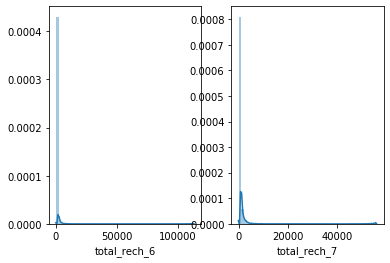

In [28]:
# Plotting the columns
plt.subplot(1,2,1)
sns.distplot(data['total_rech_6'])
plt.subplot(1,2,2)
sns.distplot(data['total_rech_7'])
plt.show()

There are no missing values here. Hence let's use these to calculate the High value customers.

In [29]:
# Calculating the average of the first two month recharges
data['avg_rech_67']= round((data['total_rech_6'] + data['total_rech_7'])/2,2)
data['avg_rech_67'].head()

0    559.0
1    306.0
2    241.5
3    270.0
4    301.0
Name: avg_rech_67, dtype: float64

In [30]:
# Picking only the data that have greater than or equal to 70 percentile of the average rechange over the first two months
data_HVI = data[data['avg_rech_67'] >= data['avg_rech_67'].quantile(0.7)]

In [31]:
# Deleting 'avg_rech_67' column since we created it for convenience
data_HVI = data_HVI.drop(['avg_rech_67','total_rech_6','total_rech_7'],axis = 1)

In [32]:
data_HVI.shape

(30001, 201)

We have dropped around 69998 records.

### Step 3: Identifying the churned customers
Identifying the churned customers in the 9th month

In [33]:
# Defining the Churn Column
data_HVI.loc[ (data_HVI.total_ic_mou_9 == 0) & (data_HVI.total_og_mou_9 == 0) & (data_HVI.vol_2g_mb_9 == 0) & ( data_HVI.vol_3g_mb_9 ==0),'Churn']=1
data_HVI['Churn'].fillna(0, inplace=True)
data_HVI['Churn'].value_counts()

0.0    27227
1.0     2774
Name: Churn, dtype: int64

In [34]:
# Calculating the churn ratio
print("The churn ratio is {} %.".format(round(len(data_HVI.loc[data_HVI.Churn==1])/len(data_HVI)*100,2)))

The churn ratio is 9.25 %.


Removing all variables associated with the month of September

In [35]:
# Shorlisting columns with _9 (September)
column_names=list(data_HVI.columns)
column_with_9=[]
for i in column_names:
    if i[-2:] == '_9':
        column_with_9.append(i)
column_with_9

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'last_day_rch_amt_9',
 'total_rech_data_9',
 'max_rech_data_9',
 'count_rech_2g_9',
 'count_rech_3g_9',
 'av_rech_amt_data_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'arpu_3g_9',
 'arpu_2g_9',
 'night_pck_user_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9',
 'fb_user_9']

In [36]:
# Dropping the September month variables from the dataframe
data_HVI.drop(column_with_9, axis=1, inplace=True)
data_HVI.shape

(30001, 153)

In [37]:
# Inspecting first few records
data_HVI.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churn
0,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,3.58,1.0
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,0.00,1.0
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0

### Step 4: Feature Engineering / Creating Derived Columns

In [38]:
# Getting a list of all columns that are related to a month - have _6 or _7 or _8 at the end
cols_with_months=[]
for i in list(data_HVI.columns):
    if i[-2:] in ('_6', '_7', '_8'):
        cols_with_months.append(i[:-2])
cols_with_months=list(set(cols_with_months))
cols_with_months

['std_og_mou',
 'total_rech_amt',
 'offnet_mou',
 'monthly_3g',
 'std_ic_t2m_mou',
 'monthly_2g',
 'roam_og_mou',
 'count_rech_3g',
 'av_rech_amt_data',
 'total_ic_mou',
 'night_pck_user',
 'roam_ic_mou',
 'total_rech_num',
 'onnet_mou',
 'vol_3g_mb',
 'isd_ic_mou',
 'ic_others',
 'std_ic_mou',
 'arpu_3g',
 'loc_og_t2m_mou',
 'total_rech_data',
 'std_ic_t2f_mou',
 'last_day_rch_amt',
 'std_og_t2m_mou',
 'std_og_t2t_mou',
 'loc_ic_t2m_mou',
 'loc_ic_t2t_mou',
 'std_ic_t2t_mou',
 'loc_og_t2f_mou',
 'vol_2g_mb',
 'og_others',
 'arpu_2g',
 'loc_og_mou',
 'arpu',
 'spl_og_mou',
 'loc_og_t2t_mou',
 'spl_ic_mou',
 'sachet_3g',
 'max_rech_amt',
 'loc_og_t2c_mou',
 'loc_ic_t2f_mou',
 'fb_user',
 'std_og_t2f_mou',
 'max_rech_data',
 'count_rech_2g',
 'isd_og_mou',
 'total_og_mou',
 'loc_ic_mou',
 'sachet_2g']

In [39]:
# For the monthly data, let's calculate the trend by doing this calculation. 8th month data minus average of 6th and 7th month
def trend(df,cols):
    for i in cols:
        col_6 = i+'_6'
        col_7 = i+'_7'
        col_8 = i+'_8'
        col_avg = i+'_trend'
        df[col_avg] = df[col_8]-(df[col_6]+df[col_7])/2
        df = df.drop([col_6,col_7,col_8],axis=1)
    return df

data_HVI = trend(data_HVI,cols_with_months)

In [40]:
# Inspecting the dataset after creating the new trend columns and dropping the original
data_HVI.head()

,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churn,std_og_mou_trend,total_rech_amt_trend,offnet_mou_trend,monthly_3g_trend,std_ic_t2m_mou_trend,monthly_2g_trend,roam_og_mou_trend,count_rech_3g_trend,av_rech_amt_data_trend,total_ic_mou_trend,night_pck_user_trend,roam_ic_mou_trend,total_rech_num_trend,onnet_mou_trend,vol_3g_mb_trend,isd_ic_mou_trend,ic_others_trend,std_ic_mou_trend,arpu_3g_trend,loc_og_t2m_mou_trend,total_rech_data_trend,std_ic_t2f_mou_trend,last_day_rch_amt_trend,std_og_t2m_mou_trend,std_og_t2t_mou_trend,loc_ic_t2m_mou_trend,loc_ic_t2t_mou_trend,std_ic_t2t_mou_trend,loc_og_t2f_mou_trend,vol_2g_mb_trend,og_others_trend,arpu_2g_trend,loc_og_mou_trend,arpu_trend,spl_og_mou_trend,loc_og_t2t_mou_trend,spl_ic_mou_trend,sachet_3g_trend,max_rech_amt_trend,loc_og_t2c_mou_trend,loc_ic_t2f_mou_trend,fb_user_trend,std_og_t2f_mou_trend,max_rech_data_trend,count_rech_2g_trend,isd_og_mou_trend,total_og_mou_trend,loc_ic_mou_trend,sachet_2g_trend
0,968,30.40,0.00,101.20,3.58,1.0,0.000,-55.0,0.000,0.0,0.000,0.0,0.000,0.0,0.0,5.440,0.0,0.00,-1.5,0.00,-7.555,0.000,0.000,0.000,0.000,0.000,0.0,0.000,0.0,0.000,0.000,4.130,0.160,0.000,0.000,-9.975,0.0,0.00,0.000,7.7025,0.00,0.000,0.000,0.0,0.0,0.00,1.150,0.0,0.00,0.0,0.0,0.000,0.000,5.440,0.0
7,802,57.74,19.38,18.74,0.00,1.0,9.840,2453.0,-184.385,0.0,32.115,0.0,19.895,0.0,0.0,-163.510,0.0,6.78,2.0,-3.97,0.000,23.295,-0.325,17.130,0.000,-215.725,0.0,-21.005,779.0,8.315,-1.785,-98.335,-17.890,6.030,-5.405,0.000,0.0,0.00,-222.245,1961.9650,4.25,-1.105,-0.105,0.0,395.0,0.00,-87.280,0.0,3.31,0.0,0.0,9.920,-198.225,-203.515,0.0
8,315,21.03,910.65,122.16,0.00,0.0,-38.590,-399.0,48.835,0.0,-12.605,-0.5,0.000,0.0,-19.5,-49.635,0.0,0.00,-6.0,-347.28,-363.535,0.000,0.000,-12.795,19.830,-25.230,2.0,0.000,-15.0,63.825,-102.415,-20.300,-16.530,-0.190,0.000,-177.970,0.0,0.00,-270.095,-298.1100,10.23,-244.870,0.000,0.0,-92.0,7.15,0.000,0.5,0.00,-54.0,2.0,0.000,-298.450,-36.840,2.5
21,720,0.00,0.00,0.00,0.00,0.0,89.800,78.0,156.085,0.0,48.780,0.0,0.000,0.0,0.0,91.550,0.0,0.00,3.0,-32.12,0.000,0.000,0.000,38.945,0.000,14.940,0.0,0.000,25.0,139.940,-50.145,32.730,13.205,-9.840,1.205,0.000,0.0,0.00,34.175,81.6570,0.00,18.020,0.000,0.0,0.0,0.00,6.665,0.0,0.00,0.0,0.0,0.000,123.975,52.605,0.0
23,604,40.45,51.86,0.00,0.00,0.0,35.255,212.0,118.505,0.0,35.250,0.0,0.000,1.0,92.0,127.095,0.0,0.00,0.0,-16.23,710.375,-10.375,10.385,48.375,43.985,65.585,1.0,0.000,-89.5,35.255,0.000,42.205,35.765,13.125,0.000,-0.230,0.0,-0.22,49.345,232.8425,17.66,-16.230,0.000,1.0,89.5,17.71,0.710,0.5,0.00,89.5,0.0,-0.005,102.270,78.690,0.0


In [41]:
# Manually calculating the trend for *_vbc_3g columns since the naming convention was different
data_HVI['vbc_3g_trend'] = data_HVI['aug_vbc_3g']- (data_HVI['jun_vbc_3g']+(data_HVI['jul_vbc_3g'])/2)
data_HVI=data_HVI.drop(['aug_vbc_3g','jun_vbc_3g','jul_vbc_3g','sep_vbc_3g'],axis=1)

In [42]:
# Inspecting the dataframe shape after creating range columns and dropping original variables
data_HVI.shape

(30001, 52)

In [43]:
# Inspecting first few records
data_HVI.head()

,aon,Churn,std_og_mou_trend,total_rech_amt_trend,offnet_mou_trend,monthly_3g_trend,std_ic_t2m_mou_trend,monthly_2g_trend,roam_og_mou_trend,count_rech_3g_trend,av_rech_amt_data_trend,total_ic_mou_trend,night_pck_user_trend,roam_ic_mou_trend,total_rech_num_trend,onnet_mou_trend,vol_3g_mb_trend,isd_ic_mou_trend,ic_others_trend,std_ic_mou_trend,arpu_3g_trend,loc_og_t2m_mou_trend,total_rech_data_trend,std_ic_t2f_mou_trend,last_day_rch_amt_trend,std_og_t2m_mou_trend,std_og_t2t_mou_trend,loc_ic_t2m_mou_trend,loc_ic_t2t_mou_trend,std_ic_t2t_mou_trend,loc_og_t2f_mou_trend,vol_2g_mb_trend,og_others_trend,arpu_2g_trend,loc_og_mou_trend,arpu_trend,spl_og_mou_trend,loc_og_t2t_mou_trend,spl_ic_mou_trend,sachet_3g_trend,max_rech_amt_trend,loc_og_t2c_mou_trend,loc_ic_t2f_mou_trend,fb_user_trend,std_og_t2f_mou_trend,max_rech_data_trend,count_rech_2g_trend,isd_og_mou_trend,total_og_mou_trend,loc_ic_mou_trend,sachet_2g_trend,vbc_3g_trend
0,968,1.0,0.000,-55.0,0.000,0.0,0.000,0.0,0.000,0.0,0.0,5.440,0.0,0.00,-1.5,0.00,-7.555,0.000,0.000,0.000,0.000,0.000,0.0,0.000,0.0,0.000,0.000,4.130,0.160,0.000,0.000,-9.975,0.0,0.00,0.000,7.7025,0.00,0.000,0.000,0.0,0.0,0.00,1.150,0.0,0.00,0.0,0.0,0.000,0.000,5.440,0.0,-70.800
7,802,1.0,9.840,2453.0,-184.385,0.0,32.115,0.0,19.895,0.0,0.0,-163.510,0.0,6.78,2.0,-3.97,0.000,23.295,-0.325,17.130,0.000,-215.725,0.0,-21.005,779.0,8.315,-1.785,-98.335,-17.890,6.030,-5.405,0.000,0.0,0.00,-222.245,1961.9650,4.25,-1.105,-0.105,0.0,395.0,0.00,-87.280,0.0,3.31,0.0,0.0,9.920,-198.225,-203.515,0.0,29.310
8,315,0.0,-38.590,-399.0,48.835,0.0,-12.605,-0.5,0.000,0.0,-19.5,-49.635,0.0,0.00,-6.0,-347.28,-363.535,0.000,0.000,-12.795,19.830,-25.230,2.0,0.000,-15.0,63.825,-102.415,-20.300,-16.530,-0.190,0.000,-177.970,0.0,0.00,-270.095,-298.1100,10.23,-244.870,0.000,0.0,-92.0,7.15,0.000,0.5,0.00,-54.0,2.0,0.000,-298.450,-36.840,2.5,-556.455
21,720,0.0,89.800,78.0,156.085,0.0,48.780,0.0,0.000,0.0,0.0,91.550,0.0,0.00,3.0,-32.12,0.000,0.000,0.000,38.945,0.000,14.940,0.0,0.000,25.0,139.940,-50.145,32.730,13.205,-9.840,1.205,0.000,0.0,0.00,34.175,81.6570,0.00,18.020,0.000,0.0,0.0,0.00,6.665,0.0,0.00,0.0,0.0,0.000,123.975,52.605,0.0,0.000
23,604,0.0,35.255,212.0,118.505,0.0,35.250,0.0,0.000,1.0,92.0,127.095,0.0,0.00,0.0,-16.23,710.375,-10.375,10.385,48.375,43.985,65.585,1.0,0.000,-89.5,35.255,0.000,42.205,35.765,13.125,0.000,-0.230,0.0,-0.22,49.345,232.8425,17.66,-16.230,0.000,1.0,89.5,17.71,0.710,0.5,0.00,89.5,0.0,-0.005,102.270,78.690,0.0,14.520


### Step 5:  Performing EDA to understand data spreads and relationships

#### Step 5.1: Univariate Analysis

In [44]:
# Inspecting the spread of the data in the dataset
data_HVI.describe()

,aon,Churn,std_og_mou_trend,total_rech_amt_trend,offnet_mou_trend,monthly_3g_trend,std_ic_t2m_mou_trend,monthly_2g_trend,roam_og_mou_trend,count_rech_3g_trend,av_rech_amt_data_trend,total_ic_mou_trend,night_pck_user_trend,roam_ic_mou_trend,total_rech_num_trend,onnet_mou_trend,vol_3g_mb_trend,isd_ic_mou_trend,ic_others_trend,std_ic_mou_trend,arpu_3g_trend,loc_og_t2m_mou_trend,total_rech_data_trend,std_ic_t2f_mou_trend,last_day_rch_amt_trend,std_og_t2m_mou_trend,std_og_t2t_mou_trend,loc_ic_t2m_mou_trend,loc_ic_t2t_mou_trend,std_ic_t2t_mou_trend,loc_og_t2f_mou_trend,vol_2g_mb_trend,og_others_trend,arpu_2g_trend,loc_og_mou_trend,arpu_trend,spl_og_mou_trend,loc_og_t2t_mou_trend,spl_ic_mou_trend,sachet_3g_trend,max_rech_amt_trend,loc_og_t2c_mou_trend,loc_ic_t2f_mou_trend,fb_user_trend,std_og_t2f_mou_trend,max_rech_data_trend,count_rech_2g_trend,isd_og_mou_trend,total_og_mou_trend,loc_ic_mou_trend,sachet_2g_trend,vbc_3g_trend
count,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000
mean,1209.368754,0.092464,-48.191001,-76.249725,-40.839975,-0.012366,-2.115253,-0.025249,-3.500272,-0.028416,-13.085795,-13.679725,-0.001667,-1.892672,-1.812056,-30.206403,-5.733637,-0.340624,-0.104915,-3.553491,-5.041000,-11.369201,-0.138845,-0.186381,-8.231159,-26.340984,-21.619843,-4.966296,-3.438286,-1.251614,-0.497993,-19.896683,-0.294315,-5.675100,-18.881308,-51.459372,0.090287,-7.013686,-0.013951,-0.016049,-10.598813,-0.026197,-1.261275,-0.043682,-0.229792,-6.467768,-0.110430,-0.189665,-67.466947,-9.666204,-0.085180,-78.821484
std,957.677989,0.289684,427.993893,418.479122,349.508726,0.474128,74.458085,0.353771,94.166701,0.992313,148.249896,222.377843,0.096681,65.973051,6.755899,308.732926,624.877555,56.734902,9.582148,98.311477,130.961477,148.308129,2.214561,13.703227,145.251806,303.804936,273.054527,135.654877,101.835561,58.651824,14.046584,256.114926,3.318383,116.362092,213.767519,332.598064,18.092787,138.240267,0.174233,0.871149,136.893018,6.974221,29.501978,0.361410,7.536604,78.343307,1.878156,14.001271,502.691886,181.293209,1.867673,436.425612
min,180.000000,0.000000,-7127.425000,-6950.000000,-7094.390000,-7.500000,-2624.905000,-3.000000,-2410.835000,-21.500000,-3486.500000,-5710.150000,-1.000000,-1296.985000,-147.500000,-5295.315000,-12385.505000,-5534.595000,-408.240000,-2777.350000,-2944.290000,-2863.535000,-30.500000,-636.500000,-3065.000000,-7037.535000,-5391.210000,-2406.805000,-3021.870000,-2897.680000,-1319.850000,-4740.925000,-304.905000,-2980.040000,-3867.830000,-5811.052500,-1081.910000,-3875.375000,-16.280000,-21.500000,-3010.000000,-384.385000,-928.210000,-1.000000,-314.280000,-1303.000000,-25.500000,-619.650000,-7213.410000,-3841.055000,-26.000000,-8505.500000
25%,460.000000,0.000000,-54.670000,-245.000000,-100.940000,0.000000,-7.445000,0.000000,0.000000,0.000000,-59.000000,-67.660000,0.000000,0.000000,-4.000000,-52.420000,-2.270000,0.000000,-0.030000,-11.935000,-4.080000,-38.820000,-0.500000,-0.115000,-52.000000,-25.995000,-12.160000,-34.630000,-15.210000,-2.830000,-1.210000,-21.120000,0.000000,-10.545000,-58.905000,-180.102500,-2.750000,-16.615000,0.000000,0.000000,-33.000000,-0.365000,-3.000000,0.000000,0.000000,-7.000000,-0.500000,0.000000,-168.115000,-50.200000,0.000000,-23.290000
50%,846.000000,0.000000,-0.405000,-57.500000,-11.040000,0.000000,-0.215000,0.000000,0.000000,0.000000,0.000000,-5.705000,0.000000,0.00

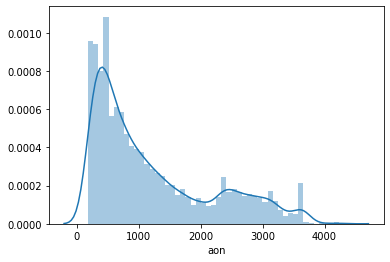

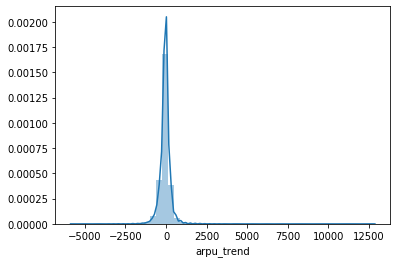

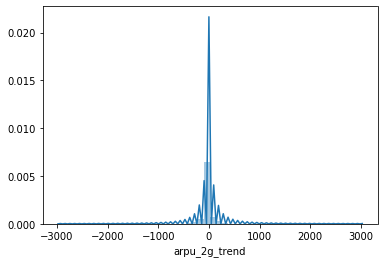

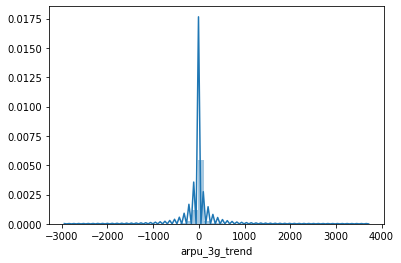

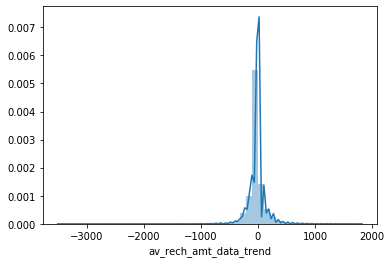

...

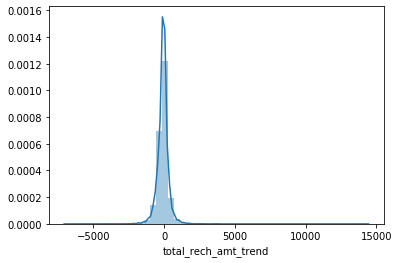

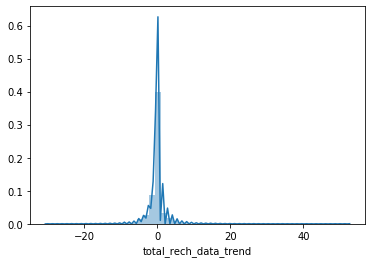

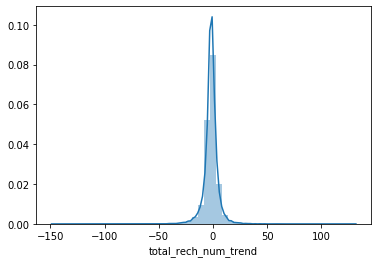

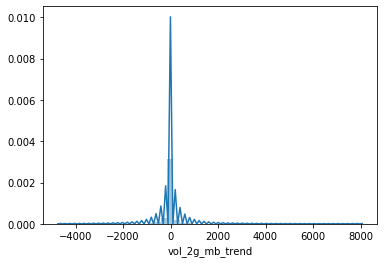

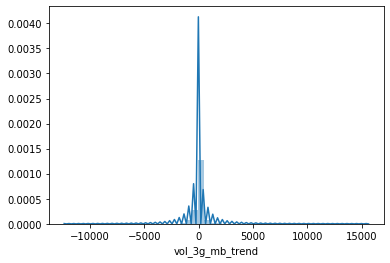

In [45]:
# Let's do a univariate analysis to understand the distribution of each column
col_plot = ['aon', 'arpu_trend', 'arpu_2g_trend', 'arpu_3g_trend', 'av_rech_amt_data_trend', 'ic_others_trend',
            'max_rech_amt_trend', 'max_rech_data_trend', 'offnet_mou_trend', 'onnet_mou_trend',  'total_ic_mou_trend',
            'total_og_mou_trend', 'total_rech_amt_trend', 'total_rech_data_trend', 'total_rech_num_trend','vol_2g_mb_trend', 'vol_3g_mb_trend']
for i in list(data_HVI[col_plot].columns):
    sns.distplot(data_HVI[col_plot][i])
    plt.show()

#### Step 5.2:  Bi-variate Analysis

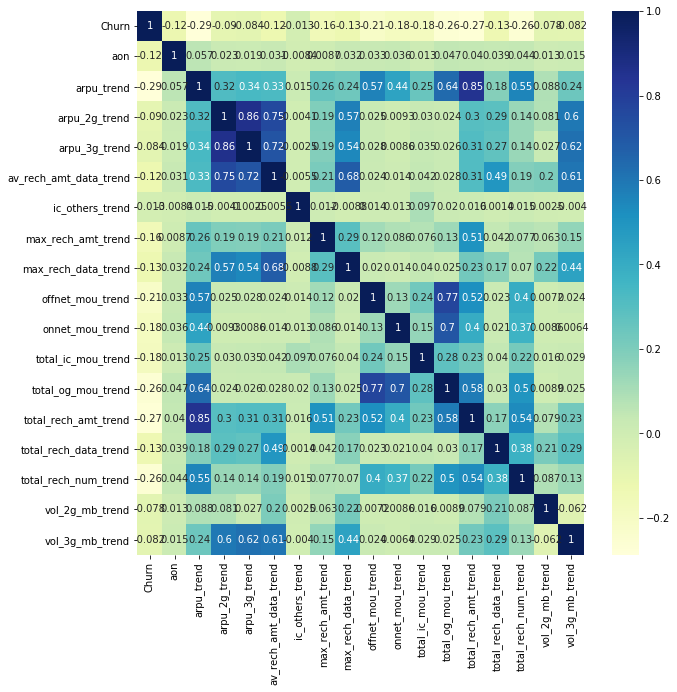

In [46]:
# Let's plot the correlation in the data
plt.figure(figsize=(10,10))
col_plot = ['Churn','aon', 'arpu_trend', 'arpu_2g_trend', 'arpu_3g_trend', 'av_rech_amt_data_trend', 'ic_others_trend',
            'max_rech_amt_trend', 'max_rech_data_trend', 'offnet_mou_trend', 'onnet_mou_trend',  'total_ic_mou_trend',
            'total_og_mou_trend', 'total_rech_amt_trend', 'total_rech_data_trend', 'total_rech_num_trend','vol_2g_mb_trend', 'vol_3g_mb_trend']

sns.heatmap(data_HVI[col_plot].corr(), annot = True, cmap = 'YlGnBu')
plt.show()

We can see that the correlated variables are present in the dataset:  
- Total reacharge amount trend and revenue per unit trend
- arpu 3g trend and arpu 2g trend
- avg recharge amount with arpu 2g and arpu 3g trend
etc.

<Figure size 1440x1440 with 0 Axes>

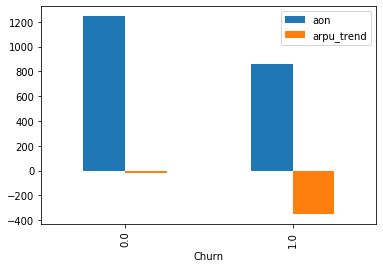

In [47]:
# Plotting few variables to understand their relationship/impact with/on churn
plt.figure(figsize=(20,20))
data_HVI.groupby(['Churn'])['aon', 'arpu_trend'].mean().plot.bar()
plt.show()

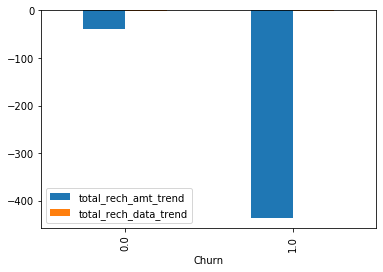

In [48]:
# Plotting few variables to understand their relationship/impact with/on churn
data_HVI.groupby(['Churn'])['total_rech_amt_trend', 'total_rech_data_trend'].mean().plot.bar()
plt.show()

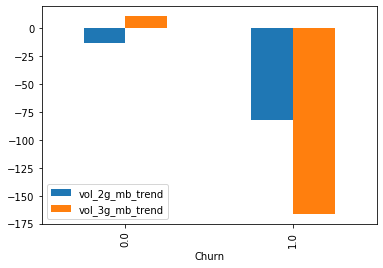

In [49]:
# Plotting few variables to understand their relationship/impact with/on churn
data_HVI.groupby(['Churn'])['vol_2g_mb_trend', 'vol_3g_mb_trend'].mean().plot.bar()
plt.show()

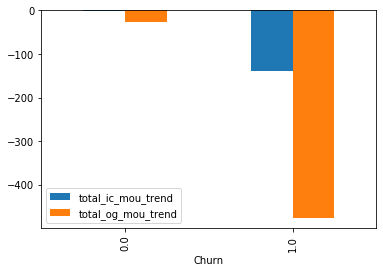

In [50]:
# Plotting few variables to understand their relationship/impact with/on churn
data_HVI.groupby(['Churn'])[ 'total_ic_mou_trend','total_og_mou_trend'].mean().plot.bar()
plt.show()

We can see from the above 3 plots that for the churned customers,  
- Average Revenue per user drops significantly for the churn customers in the "action" phase (month Aug in our case) just before they leave the operator
- There is a sharper drop in the outgoing calls and incoming calls in the churn customers during the action phase than non-churn customers. It also appears that the drop is more significant in the outgoing calls than the incoming calls
- There is significant drop in Total Recharge Amount in the Action phase compared to Good phase  
- The churned customers had less number of association year with the operator. So newer customers are churning more  
- The number of voice calls (same network or outside) by the churn customers tend to be higher in the "Good" phase (more than the non-churn customers) and then drop significantly in the "action" phase. This might indicate they join the network due to a promo or short term deal and leave when that promo period expires  
- Both the 2g and 3g services are less utilized by the churn customers in the action month. The churn customers prefer to use 3g packets (less than month validity) than monthly service schemes. Its the opposite for non churn customers who prefer monthly service schemes than packets

## Step 6: Model Building
### Splitting the data into test and train

In [51]:
# Identifying the X and y variables for model building
y = data_HVI.pop('Churn')
X = data_HVI

In [52]:
# splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=50)

### Scaling the data

In [53]:
# Inspecting the data before scaling
X_train.head()

,aon,std_og_mou_trend,total_rech_amt_trend,offnet_mou_trend,monthly_3g_trend,std_ic_t2m_mou_trend,monthly_2g_trend,roam_og_mou_trend,count_rech_3g_trend,av_rech_amt_data_trend,total_ic_mou_trend,night_pck_user_trend,roam_ic_mou_trend,total_rech_num_trend,onnet_mou_trend,vol_3g_mb_trend,isd_ic_mou_trend,ic_others_trend,std_ic_mou_trend,arpu_3g_trend,loc_og_t2m_mou_trend,total_rech_data_trend,std_ic_t2f_mou_trend,last_day_rch_amt_trend,std_og_t2m_mou_trend,std_og_t2t_mou_trend,loc_ic_t2m_mou_trend,loc_ic_t2t_mou_trend,std_ic_t2t_mou_trend,loc_og_t2f_mou_trend,vol_2g_mb_trend,og_others_trend,arpu_2g_trend,loc_og_mou_trend,arpu_trend,spl_og_mou_trend,loc_og_t2t_mou_trend,spl_ic_mou_trend,sachet_3g_trend,max_rech_amt_trend,loc_og_t2c_mou_trend,loc_ic_t2f_mou_trend,fb_user_trend,std_og_t2f_mou_trend,max_rech_data_trend,count_rech_2g_trend,isd_og_mou_trend,total_og_mou_trend,loc_ic_mou_trend,sachet_2g_trend,vbc_3g_trend
4773,800,-3.205,108.0,92.390,0.0,0.195,0.0,0.00,0.0,0.0,-31.470,0.0,0.000,-2.5,-110.500,0.00,0.000,0.0,0.195,0.000,95.825,0.0,0.000,20.0,-3.205,0.00,-39.665,6.560,0.000,-0.325,0.000,-3.48,0.000,-15.000,-6.1245,0.335,-110.500,0.000,0.0,20.0,0.1,1.440,0.0,0.00,0.0,0.0,0.0,-21.355,-31.660,0.0,0.000
24832,1111,0.000,29.5,-11.985,0.0,-0.265,0.0,0.00,0.0,3.5,-12.485,0.0,0.000,0.5,-1.720,-10.98,-5.715,0.0,-0.845,0.000,-10.775,1.0,0.000,-2.5,0.000,0.00,-7.410,4.130,-0.580,0.000,253.405,-0.69,-0.150,-12.500,22.0245,-1.120,-1.720,0.000,0.0,0.0,0.0,-2.645,0.0,0.00,0.0,1.0,0.0,-14.305,-5.920,1.0,-18.155
68515,797,-39.695,-423.5,-28.495,2.0,1.330,0.0,10.60,2.0,183.0,-184.290,0.0,3.050,0.5,-88.415,686.31,0.000,-14.2,12.110,172.680,-28.340,2.0,-15.645,-130.5,-4.040,-34.77,-81.115,-18.560,26.415,-0.075,-121.355,0.00,151.420,-79.745,-350.6350,-8.070,-51.335,-0.325,0.0,-102.0,0.0,-82.190,0.0,-0.89,-107.0,0.0,0.0,-127.510,-181.870,0.0,0.000
64943,1789,0.000,19.0,134.030,-0.5,-1.865,-0.5,0.00,-0.5,-166.5,105.090,0.0,0.000,-2.0,51.695,0.00,0.000,0.0,2.215,-75.335,111.670,-1.0,0.000,228.5,0.000,0.00,56.020,69.815,4.080,22.355,-125.485,0.00,-87.335,185.715,-85.5065,0.000,51.695,0.000,0.0,139.0,0.0,-22.965,-1.0,0.00,-166.5,-0.5,0.0,185.715,102.880,0.0,0.000
94418,584,0.000,-55.0,-6.360,0.0,0.000,0.0,-5.79,0.0,0.0,-0.825,0.0,-0.515,-0.5,0.000,-257.02,0.000,0.0,0.000,0.440,-0.445,0.0,0.000,-252.0,0.000,0.00,-0.825,0.000,0.000,0.000,3.685,0.00,0.000,-0.445,-1.1005,-0.125,0.000,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.0,-0.570,-0.825,0.0,-147.345


In [54]:
# Scaling X using standard scaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
cols=X_train.columns
X_train[cols] = scaler.fit_transform(X_train[cols])
X_train.head()

,aon,std_og_mou_trend,total_rech_amt_trend,offnet_mou_trend,monthly_3g_trend,std_ic_t2m_mou_trend,monthly_2g_trend,roam_og_mou_trend,count_rech_3g_trend,av_rech_amt_data_trend,total_ic_mou_trend,night_pck_user_trend,roam_ic_mou_trend,total_rech_num_trend,onnet_mou_trend,vol_3g_mb_trend,isd_ic_mou_trend,ic_others_trend,std_ic_mou_trend,arpu_3g_trend,loc_og_t2m_mou_trend,total_rech_data_trend,std_ic_t2f_mou_trend,last_day_rch_amt_trend,std_og_t2m_mou_trend,std_og_t2t_mou_trend,loc_ic_t2m_mou_trend,loc_ic_t2t_mou_trend,std_ic_t2t_mou_trend,loc_og_t2f_mou_trend,vol_2g_mb_trend,og_others_trend,arpu_2g_trend,loc_og_mou_trend,arpu_trend,spl_og_mou_trend,loc_og_t2t_mou_trend,spl_ic_mou_trend,sachet_3g_trend,max_rech_amt_trend,loc_og_t2c_mou_trend,loc_ic_t2f_mou_trend,fb_user_trend,std_og_t2f_mou_trend,max_rech_data_trend,count_rech_2g_trend,isd_og_mou_trend,total_og_mou_trend,loc_ic_mou_trend,sachet_2g_trend,vbc_3g_trend
4773,-0.424975,0.107882,0.442980,0.384981,0.030812,0.034737,0.073208,0.035659,0.029165,0.093377,-0.077683,0.019393,0.031343,-0.101186,-0.266755,0.014369,0.003654,0.007812,0.037460,0.044691,0.714226,0.062998,0.013695,0.194552,0.078718,0.081153,-0.247537,0.095158,0.015913,0.022712,0.074028,-0.818211,0.050925,0.014405,0.136519,0.015152,-0.748717,0.086692,0.016373,0.227027,0.014729,0.092634,0.125086,0.027294,0.087881,0.058705,0.012022,0.092401,-0.117665,0.045198,0.182375
24832,-0.099294,0.115414,0.254674,0.086305,0.030812,0.028638,0.073208,0.035659,0.029165,0.117016,0.005790,0.019393,0.031343,0.344802,0.089470,-0.003539,-0.089941,0.007812,0.027161,0.044691,0.006309,0.515525,0.013695,0.041038,0.089288,0.081153,-0.014977,0.071514,0.006364,0.044844,1.039542,-0.101858,0.049645,0.025984,0.221044,-0.062182,0.028630,0.086692,0.016373,0.079987,-0.000240,-0.043185,0.125086,0.027294,0.087881,0.590655,0.012022,0.106480,0.021516,0.580391,0.140731
68515,-0.428116,0.022126,-0.831983,0.039060,4.266814,0.049787,0.073208,0.147222,2.050526,1.329386,-0.749601,0.019393,0.077435,0.344802,-0.194433,1.133730,0.003654,-1.410791,0.155458,1.388411,-0.110338,0.968052,-1.079465,-0.832283,0.075964,-0.048111,-0.546394,-0.149259,0.450834,0.039736,-0.388354,0.075305,1.342825,-0.285457,-0.897966,-0.431581,-0.325921,-2.029444,0.016373,-0.669921,-0.000240,-2.687909,0.125086,-0.089854,-1.285888,0.058705,0.012022,-0.119591,-0.929874,0.045198,0.182375
64943,0.610712,0.115414,0.229487,0.504137,-1.028189,0.007423,-1.339819,0.035659,-0.476175,-1.031188,0.522743,0.019393,0.031343,-0.026855,0.264390,0.014369,0.003654,0.007812,0.057465,-0.541534,0.819450,-0.389529,0.013695,1.617110,0.089288,0.081153,0.442357,0.710627,0.083090,1.567169,-0.404090,0.075305,-0.694209,0.944004,-0.101847,-0.002653,0.410336,0.086692,0.016373,1.101919,-0.000240,-0.718787,-2.641422,0.027294,-2.049807,-0.207271,0.012022,0.505920,0.609815,0.045198,0.182375
94418,-0.651171,0.115414,0.051976,0.102401,0.030812,0.032152,0.073208,-0.025280,0.029165,0.093377,0.057057,0.019393,0.023561,0.196139,0.095102,-0.404826,0.003654,0.007812,0.035529,0.048114,0.074909,0.062998,0.013695,-1.661256,0.089288,0.081153,0.032501,0.031329,0.015913,0.044844,0.088068,0.075305,0.050925,0.081816,0.151605,-0.009297,0.040921,0.086692,0.016373,0.079987,-0.000240,0.044756,0.125086,0.027294,0.087881,0.058705,0.012022,0.133909,0.049065,0.045198,-0.155606


In [55]:
# Scaling the test data
X_test[cols]=scaler.transform(X_test[cols])
X_test.head()

,aon,std_og_mou_trend,total_rech_amt_trend,offnet_mou_trend,monthly_3g_trend,std_ic_t2m_mou_trend,monthly_2g_trend,roam_og_mou_trend,count_rech_3g_trend,av_rech_amt_data_trend,total_ic_mou_trend,night_pck_user_trend,roam_ic_mou_trend,total_rech_num_trend,onnet_mou_trend,vol_3g_mb_trend,isd_ic_mou_trend,ic_others_trend,std_ic_mou_trend,arpu_3g_trend,loc_og_t2m_mou_trend,total_rech_data_trend,std_ic_t2f_mou_trend,last_day_rch_amt_trend,std_og_t2m_mou_trend,std_og_t2t_mou_trend,loc_ic_t2m_mou_trend,loc_ic_t2t_mou_trend,std_ic_t2t_mou_trend,loc_og_t2f_mou_trend,vol_2g_mb_trend,og_others_trend,arpu_2g_trend,loc_og_mou_trend,arpu_trend,spl_og_mou_trend,loc_og_t2t_mou_trend,spl_ic_mou_trend,sachet_3g_trend,max_rech_amt_trend,loc_og_t2c_mou_trend,loc_ic_t2f_mou_trend,fb_user_trend,std_og_t2f_mou_trend,max_rech_data_trend,count_rech_2g_trend,isd_og_mou_trend,total_og_mou_trend,loc_ic_mou_trend,sachet_2g_trend,vbc_3g_trend
55440,-0.577867,0.020951,-1.738730,-0.385769,-3.146190,-0.150427,0.073208,0.035659,-1.486855,-2.459690,0.082096,0.019393,0.031343,-0.695838,0.370835,-1.595371,0.533289,0.007812,-0.148722,-2.235581,-0.557501,-0.615792,-0.299684,0.058095,-0.095684,0.155340,0.179622,-0.047386,0.009904,-1.306556,0.103328,0.075305,-2.664395,-0.153623,-1.359804,-0.072547,0.500019,0.086692,0.016373,0.065283,-0.000240,-0.632010,0.125086,-0.507771,0.087881,0.058705,-0.084168,-0.052821,0.005592,0.045198,-0.628361
18146,0.119572,0.115414,-0.049973,0.060651,-1.028189,-0.004841,0.073208,0.035659,-0.476175,-0.014689,-0.166432,0.019393,0.031343,0.419134,0.030688,0.014369,-0.000686,0.007812,0.007899,-0.430257,-0.056049,1.420579,0.013695,-0.457028,0.089288,0.081153,-0.029397,-0.376065,0.015913,-0.008272,0.087630,0.075305,-0.469905,-0.104275,-0.022111,-0.002653,-0.099641,0.086692,0.016373,-0.386867,-0.000240,0.133529,0.125086,0.027294,-0.881461,1.920531,0.012022,0.053919,-0.209262,1.918373,0.182375
18796,-0.394606,-0.521190,-0.743227,0.059291,0.030812,0.048858,0.073208,0.035659,0.029165,0.093377,-0.390713,0.019393,0.031343,-0.324181,-0.937387,0.014369,0.003654,0.007812,0.039788,0.044691,-0.070759,0.062998,-0.122557,0.569807,0.102283,-0.940506,-0.300098,-0.514133,0.034436,0.044844,0.074028,-0.091587,0.050925,-0.207301,-0.587139,-0.200109,-0.248351,-0.401647,0.016373,0.153507,-0.000240,0.044756,0.125086,0.027294,0.087881,0.058705,0.012022,-0.540178,-0.503547,0.045198,0.182375
26849,-0.789402,0.197481,0.471766,0.340341,-1.028189,0.145850,0.073208,0.035659,-0.476175,-0.757645,0.418759,0.019393,0.031343,1.013785,0.331341,-1.077085,0.003654,0.007812,0.143772,-0.780817,0.368967,-0.163265,-0.043251,0.597098,0.204457,0.081153,0.394554,0.222474,0.067942,0.288293,-0.048869,0.075305,-0.854182,0.637542,0.595514,-0.277709,0.556437,0.086692,0.016373,0.624037,0.355275,0.093299,-1.258168,0.027294,-1.529829,0.058705,0.012022,0.433199,0.434731,0.045198,0.332609
96898,-0.179929,-0.778260,-0.973512,-1.542316,0.030812,0.484357,0.073208,0.035659,0.029165,0.093377,0.032413,0.019393,0.031343,-0.324181,0.018506,0.014369,0.003654,-0.432255,0.346839,0.044691,-1.152856,0.062998,-0.016001,-0.555959,-1.247535,0.174319,-0.215380,0.084552,-0.020886,-0.347740,0.074028,-0.679562,0.050925,-1.025607,-0.837139,0.417770,-0.305376,-1.964332,0.016373,-0.158954,2.330440,-0.068786,0.125086,0.027294,0.087881,0.058705,0.012022,-1.092808,-0.125694,0.045198,0.182375


In [56]:
X_train.shape

(21000, 51)

In [57]:
X_test.shape

(9001, 51)

#### Handling Class Imbalance

In [58]:
# Since this is a imbalanced class dataset with only 9.25% of the customers churning, we will use resample from Sklearn to make uniform distribution of churn records across samples
from sklearn.utils import resample
# concatenate our training data back together
X = pd.concat([X_train, y_train], axis=1)

# separate minority and majority classes
not_churn = X[X.Churn==0]
churn = X[X.Churn==1]

# upsample minority
churn_upsampled = resample(churn,
                          replace=True, # sample with replacement
                          n_samples=len(not_churn), # match number in majority class
                          random_state=27) # reproducible results

# combine majority and upsampled minority
upsampled = pd.concat([not_churn, churn_upsampled])

# check new class counts
upsampled.Churn.value_counts()

1.0    19025
0.0    19025
Name: Churn, dtype: int64

In [59]:
# Recreating the training dataset from the resample
y_train = upsampled.Churn
X_train = upsampled.drop('Churn', axis=1)

## Step 6.1: Building interpretable model
### Step 6.1.1 Logistic Regression

### Feature selection using RFE

In [60]:
# Importing the required libraries and instantiating the model
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [61]:
# We will use RFE. So lets check the number of variables in X prior to deciding how many variables to keep for RFE
X_train.shape

(38050, 51)

Since we have 51 columns, we can start with say 15 columns for RFE which is 1/3rd of the initial columns

In [62]:
# Running the RFE model
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [63]:
# storing the RFE output
col = X_train.columns[rfe.support_]

In [64]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,total_rech_data_trend,68.17
14,sachet_2g_trend,47.21
1,count_rech_3g_trend,12.81
9,arpu_trend,3.07
5,arpu_3g_trend,2.59
12,total_og_mou_trend,2.40
2,total_rech_num_trend,2.07
3,vol_3g_mb_trend,2.04
11,fb_user_trend,1.72
10,max_rech_amt_trend,1.70


In [65]:
# Doing a logistic regression on the training dataset
import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                38050
Model:                            GLM   Df Residuals:                    38034
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -19556.
Date:                Mon, 23 Nov 2020   Deviance:                       39112.
Time:                        20:02:33   Pearson chi2:                 2.44e+05
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0.6847      0.014    -47.910      0.000      -0.713      -0.657
aon                       -0.4149      0.014    -29.511      0.000      -0.442      -0.387
count_rech_3g_trend       -0.3132      0.048     -6.522      0.000      -0.407      -0.219
total_rech_num_trend      -0.2186      0.018    -12.183      0.000      -0.254      -0.183
vol_3g_mb_trend           -0.1451      0.020     -7.338      0.000      -0.184      -0.106
std_ic_mou_trend          -0.1863      0.018    -10.302      0.000      -0.222      -0.151
arpu_3g_trend              0.1424      0.023      6.246      0.000       0.098       0.187
total_rech_data_trend      0.3484      0.101      3.454      0.001       0.151       0.546
last_day_rch_amt_trend    -0.1782      0.017    -10.488      0.000      -0.212      -0.145
vol_2g_mb_trend           -0.1585      0.015    -10.579      0.000      -0.188      -0.129
arpu_trend                -0.2827      0.022    -12.589      0.000      -0.327      -0.239
max_rech_amt_trend        -0.2193      0.016    -14.001      0.000      -0.250      -0.189
fb_user_trend             -0.3125      0.015    -20.795      0.000      -0.342      -0.283
total_og_mou_trend        -0.4565      0.020    -22.458      0.000      -0.496      -0.417
loc_ic_mou_trend          -0.3475      0.018    -18.851      0.000      -0.384      -0.311
sachet_2g_trend           -0.4621      0.083     -5.569      0.000      -0.625      -0.299
==========================================================================================
"""

In [66]:
# Removing 'total_rech_data_trend' columns and checking the vif again
col=col.drop('total_rech_data_trend')
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,arpu_trend,3.06
5,arpu_3g_trend,2.40
11,total_og_mou_trend,2.39
2,total_rech_num_trend,2.07
3,vol_3g_mb_trend,1.91
9,max_rech_amt_trend,1.70
1,count_rech_3g_trend,1.67
10,fb_user_trend,1.58
6,last_day_rch_amt_trend,1.47
13,sachet_2g_trend,1.33


The max VIF is less than 5 for all variables indicating multicolinearity doesnt exist

In [175]:
# Doing a logistic regression on the training dataset
import statsmodels.api as sm
from sklearn import metrics

logreg = LogisticRegression()
logm1 = logreg.fit(X_train[col], y_train)

y_train_pred = logm1.predict(X_train[col])

#Creating a dataframe with the actual churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustIndex'] = y_train.index

# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

print("Train Precision : {}".format(round(metrics.precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted),2)))
print("Train Recall : {}".format(round(metrics.recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted),2)))
print("Train Accuracy : {}".format(round(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted),2)))

# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print("Train Confusion Matrix \n", confusion)

Train Precision : 0.79
Train Recall : 0.76
Train Accuracy : 0.78
Train Confusion Matrix 
 [[15217  3808]
 [ 4576 14449]]


We are focused on the Recall in this exercise since the emphasis is to capture all churn customers. So maximize True Positive and minimize False Negatives. The higher the recall ratio the better would be our ability to idenitfy churn customers and reduce possibility of missing out on identifying any churn customer

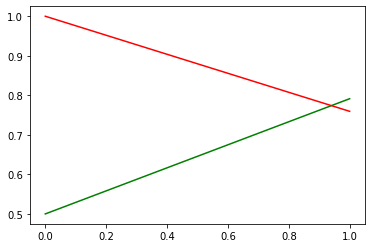

In [176]:
# Plotting a precision-Recall curve to find the optimal cutoff point
from sklearn.metrics import precision_recall_curve
#y_train_pred_final.Churn, y_train_pred_final.predicted
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

From the curve above, the two lines intersect at 0.9. So we can say that 0.9 seems to be a optimal cutoff point

   Churn  Churn_Prob  CustIndex  predicted  0.0  0.1  0.2  0.3  0.4  0.5  0.6  \
0    0.0         0.0       4773          0    0    0    0    0    0    0    0   
1    0.0         0.0      24832          0    0    0    0    0    0    0    0   
2    0.0         1.0      68515          1    1    1    1    1    1    1    1   
3    0.0         0.0      64943          0    0    0    0    0    0    0    0   
4    0.0         0.0      94418          0    0    0    0    0    0    0    0   

   0.7  0.8  0.9  1.0  
0    0    0    0    0  
1    0    0    0    0  
2    1    1    1    0  
3    0    0    0    0  
4    0    0    0    0  
     prob  accuracy     sensi     speci
0.0   0.0  0.779658  0.759474  0.799842
0.1   0.1  0.779658  0.759474  0.799842
0.2   0.2  0.779658  0.759474  0.799842
0.3   0.3  0.779658  0.759474  0.799842
0.4   0.4  0.779658  0.759474  0.799842
0.5   0.5  0.779658  0.759474  0.799842
0.6   0.6  0.779658  0.759474  0.799842
0.7   0.7  0.779658  0.759474  0.799842
0.8   0.8

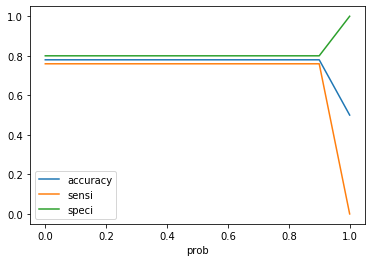

In [177]:
# We can also plot the specificity, sensitivity and accuracy graphs to revalidate the cutoff point
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(11)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
print(y_train_pred_final.head())

# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9, 1]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

We get the same result of 0.9 as the cutoff point. So we will make predictions on the test dataset using this cutoff value

In [178]:
#Working on the test dataset with the optimal cutoff (0.9)
#----------------------------------------------------
y_test_pred = logm1.predict(X_test[col])

#Creating a dataframe with the actual churn flag and the predicted probabilities
y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['CustIndex'] = y_test.index

# Creating new column 'predicted' with 1 if Churn_Prob > 0.9 else 0
y_test_pred_final['predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.9 else 0)

print("Test Precision : {}".format(round(metrics.precision_score(y_test_pred_final.Churn, y_test_pred_final.predicted),2)))
print("Test Recall : {}".format(round(metrics.recall_score(y_test_pred_final.Churn, y_test_pred_final.predicted),2)))
print("Test Accuracy : {}".format(round(metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.predicted),2)))

# Confusion matrix 
confusion = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.predicted )
print("Test Confusion Matrix \n", confusion)

Test Precision : 0.28
Test Recall : 0.78
Test Accuracy : 0.8
Test Confusion Matrix 
 [[6576 1626]
 [ 178  621]]


In [179]:
# inspecting the final test predicted dataset with churn probability and predicted churn based on cutoff
y_test_pred_final

,Churn,Churn_Prob,CustIndex,predicted
0,0.0,1.0,55440,1
1,0.0,0.0,18146,0
2,0.0,0.0,18796,0
3,0.0,0.0,26849,0
4,0.0,1.0,96898,1
...,...,...,...,...
8996,0.0,0.0,97775,0
8997,0.0,0.0,59431,0
8998,0.0,0.0,58507,0
8999,0.0,0.0,67523,0


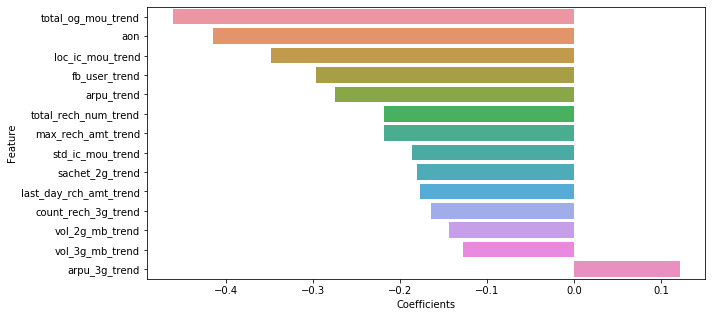

In [180]:
# Identifying the features that have most impact
Logist_model_outcome=pd.DataFrame({"Feature":list(X_test[col].columns),"Coefficients":logm1.coef_.reshape(-1)})
Logist_model_outcome

# Plotting the same
plt.figure(figsize = (10,5))
Logist_model_outcome = Logist_model_outcome.sort_values('Coefficients')
sns.barplot(Logist_model_outcome['Coefficients'],Logist_model_outcome['Feature'],orient = 'h')
plt.show()

In [73]:
# Plotting the ROC curve to determine the Area Under Curve (AUC)
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

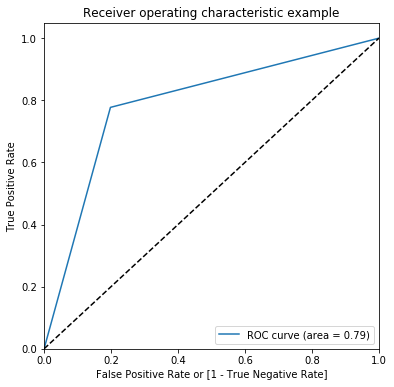

(array([0.        , 0.19824433, 1.        ]),
 array([0.        , 0.77722153, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [74]:
draw_roc(y_test_pred_final.Churn, y_test_pred_final.predicted)

In [75]:
#draw_roc(y_pred_final.Churn, y_pred_final.predicted)
"{:2.2f}".format(metrics.roc_auc_score(y_test_pred_final.Churn, y_test_pred_final.Churn_Prob))

'0.79'

### Step 6.1.2: Decision Tree with RFE

In [76]:
# Resetting the col to contain the RFE output
#col = X_train.columns[rfe.support_]

In [77]:
from sklearn.tree import DecisionTreeClassifier
model1 = DecisionTreeClassifier(max_depth=5,class_weight='balanced')
model1.fit(X_train[col], y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [78]:
print(model1.score(X_train[col], y_train))

0.8020499342969777


In [79]:
# Making predictions
y_pred_test = model1.predict(X_test[col])

In [80]:
# Printing out all accuracies
print("Precision : {}".format(round(metrics.precision_score(y_test, y_pred_test),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test, y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))

Precision : 0.27
Recall : 0.79
Accuracy : 0.79
ROC-AUC Score : 0.79


In [81]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.97      0.79      0.87      8202
         1.0       0.27      0.79      0.40       799

    accuracy                           0.79      9001
   macro avg       0.62      0.79      0.64      9001
weighted avg       0.91      0.79      0.83      9001



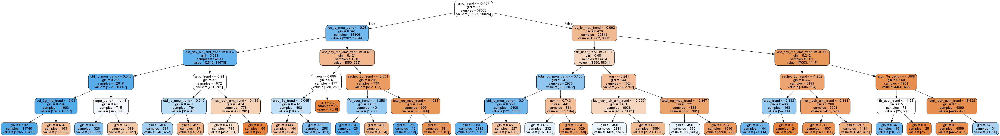

In [82]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
#features = list(model1[1:])
features=pd.DataFrame(X_train[col]).columns
features

# plotting tree with max_depth=5
dot_data = StringIO()  
export_graphviz(model1, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Step 6.1.3: Decision Tree with Hyperparameter Tuning

#### Tuning max_depth

In [83]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 40, 5)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring='recall', 
                   return_train_score=True)
tree.fit(X_train[col], y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(1, 40, 5)}, pre_dispatch='2*n_jobs'

In [84]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.105606,0.027253,0.014601,0.003383,1,{'max_depth': 1},0.629961,0.635480,0.636005,0.638371,0.624704,0.632904,0.004940,8,0.632917,0.632457,0.633574,0.631735,0.635151,0.633167,0.001159
1,0.361221,0.068290,0.014601,0.003007,6,{'max_depth': 6},0.824442,0.815243,0.796583,0.802365,0.807359,0.809198,0.009779,7,0.820499,0.809198,0.802891,0.816229,0.816623,0.813088,0.006267
2,0.837848,0.113571,0.022201,0.010648,11,{'max_depth': 11},0.916689,0.907227,0.918003,0.929829,0.920105,0.918371,0.007231,6,0.926216,0.916360,0.933246,0.941327,0.935085,0.930447,0.008533
3,1.048460,0.262403,0.019801,0.008329,16,{'max_depth': 16},0.983968,0.980289,0.987911,0.983443,0.985283,0.984179,0.002484,5,0.987648,0.984494,0.990013,0.986662,0.989882,0.987740,0.002072
4,0.541831,0.050399,0.009801,0.002136,21,{'max_depth': 21},0.998686,0.998949,0.997898,1.000000,0.997109,0.998528,0.000978,4,0.998817,0.999212,0.999146,1.000000,0.998883,0.999212,0.000422


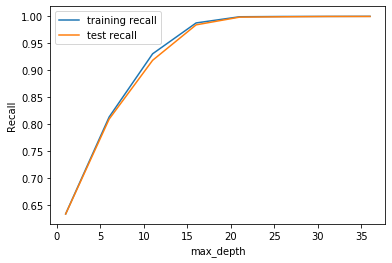

In [85]:
# plotting recall with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()


#### Tuning min_samples_leaf

In [86]:
# GridSearchCV to find optimal min_sample_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall", 
                   return_train_score=True)
tree.fit(X_train[col], y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             p

In [87]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.906652,0.140588,0.014601,0.002245,5,{'min_samples_leaf': 5},0.981866,0.982129,0.983180,0.985283,0.981340,0.982760,0.001397,1,0.994612,0.992444,0.993561,0.994678,0.993890,0.993837,0.000816
1,0.741842,0.110940,0.014401,0.003007,25,{'min_samples_leaf': 25},0.894875,0.900657,0.897766,0.889619,0.870959,0.890775,0.010558,2,0.912221,0.914717,0.913863,0.908016,0.903219,0.910407,0.004271
2,0.819247,0.124053,0.017201,0.002227,45,{'min_samples_leaf': 45},0.885151,0.867017,0.860972,0.863338,0.858081,0.866912,0.009578,3,0.889750,0.882917,0.877727,0.878055,0.877661,0.881222,0.004702
3,0.662238,0.142052,0.013601,0.002154,65,{'min_samples_leaf': 65},0.856505,0.837057,0.834954,0.839159,0.847832,0.843101,0.008006,4,0.859198,0.845664,0.847240,0.855585,0.866097,0.854757,0.007592
4,0.652637,0.087164,0.015001,0.003287,85,{'min_samples_leaf': 85},0.811564,0.843627,0.812878,0.821288,0.834428,0.824757,0.012464,5,0.824770,0.847766,0.832917,0.840013,0.845664,0.838226,0.008471


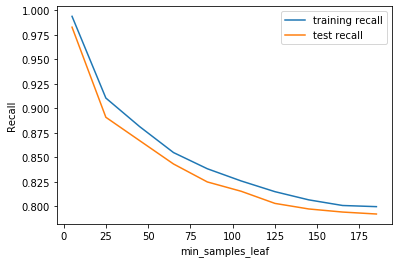

In [88]:
# plotting recall with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()


#### Tuning min_samples_split

In [89]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True)
tree.fit(X_train[col], y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             

In [90]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.057261,0.113259,0.019001,0.004899,5,{'min_samples_split': 5},0.997898,1.000000,0.999737,0.999212,0.998949,0.999159,0.000732,1,0.999737,0.999934,0.999934,0.999934,1.000000,0.999908,0.000089
1,1.182268,0.038225,0.018201,0.001470,25,{'min_samples_split': 25},0.962681,0.971353,0.973982,0.967148,0.965572,0.968147,0.004046,2,0.976018,0.982063,0.984100,0.978449,0.979763,0.980079,0.002805
2,1.132665,0.052067,0.020601,0.002154,45,{'min_samples_split': 45},0.937976,0.944809,0.951117,0.931669,0.946386,0.942392,0.006818,3,0.956899,0.962878,0.965506,0.956373,0.961629,0.960657,0.003518
3,1.008058,0.164031,0.016201,0.002926,65,{'min_samples_split': 65},0.927201,0.939816,0.935874,0.912746,0.925361,0.928200,0.009399,4,0.942641,0.955322,0.949803,0.933771,0.945926,0.945493,0.007224
4,0.934253,0.175802,0.014001,0.001095,85,{'min_samples_split': 85},0.916426,0.931669,0.922996,0.898029,0.918265,0.917477,0.011062,5,0.932392,0.943561,0.937188,0.922602,0.936728,0.934494,0.006933


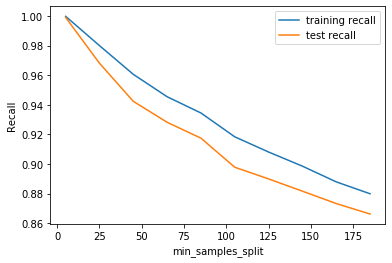

In [91]:
# plotting recall with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid search to find optimal hyperparameters

In [92]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(15, 25, 5),
    'min_samples_leaf': range(5, 10, 5),
    'min_samples_split': range(5, 10, 5),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, scoring='recall', 
                   return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train[col],y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:   18.2s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                   

In [93]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.068461,0.127427,0.019401,0.006917,entropy,15,5,5,"{'criterion': 'entropy', 'max_depth': 15, 'min...",0.954796,0.972142,0.971091,0.976347,0.971879,0.969251,0.007456,3,0.967346,0.985808,0.975953,0.985677,0.978581,0.978673,0.006866
1,0.999457,0.162363,0.014401,0.002245,entropy,20,5,5,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.978449,0.983706,0.981340,0.987385,0.987122,0.983601,0.003417,1,0.989159,0.993693,0.992707,0.993035,0.993298,0.992378,0.001642
2,0.494028,0.061202,0.008601,0.000490,gini,15,5,5,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",0.968200,0.967674,0.971353,0.965046,0.967674,0.967989,0.002011,4,0.976413,0.975099,0.982260,0.974704,0.978975,0.977490,0.002814
3,0.831048,0.212434,0.016801,0.004445,gini,20,5,5,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.981866,0.983443,0.985283,0.983706,0.981078,0.983075,0.001474,2,0.993824,0.993430,0.993364,0.994481,0.993233,0.993666,0.000453


In [94]:
# printing the optimal recall score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.9836005256241787
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [95]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(random_state = 100,
                                 ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                        splitter='best')
clf_entropy.fit(X_train[col], y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [96]:
# accuracy score
clf_entropy.score(X_train[col],y_train)

0.9669908015768726

We can see that the Accuracy of the model has increased from 80% to 96.6%.

In [97]:
# classification metrics
from sklearn.metrics import classification_report,confusion_matrix
y_pred_test = clf_entropy.predict(X_test[col])
print(classification_report(y_test, y_pred_test))

# confusion matrix
print(confusion_matrix(y_test,y_pred_test))

# Printing out all accuracies
print("Precision : {}".format(round(metrics.precision_score(y_test, y_pred_test),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test, y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))

              precision    recall  f1-score   support

         0.0       0.96      0.89      0.92      8202
         1.0       0.35      0.59      0.44       799

    accuracy                           0.87      9001
   macro avg       0.65      0.74      0.68      9001
weighted avg       0.90      0.87      0.88      9001

[[7312  890]
 [ 324  475]]
Precision : 0.35
Recall : 0.59
Accuracy : 0.87
ROC-AUC Score : 0.74


Though the Accuracy has slightly improved using the optimal parameters, the recall for Churned customers has reduced.
In order to interpret let's create a decision tree wth 3 depth.

In [98]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.552759 to fit



In [99]:
# tree with max_depth = 3
clf_entropy = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=3, 
                                  min_samples_leaf=5,
                                  min_samples_split=5)
clf_entropy.fit(X_train[col], y_train)

# score
print(clf_entropy.score(X_test[col],y_test))

0.8283524052883013


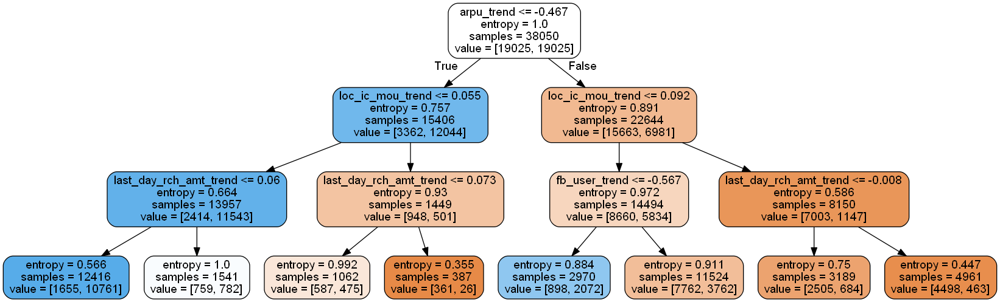

In [100]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [101]:
# classification metrics
from sklearn.metrics import classification_report,confusion_matrix
y_pred_test = clf_entropy.predict(X_test[col])
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.97      0.83      0.90      8202
         1.0       0.31      0.76      0.44       799

    accuracy                           0.83      9001
   macro avg       0.64      0.80      0.67      9001
weighted avg       0.91      0.83      0.86      9001



In [102]:
# confusion matrix
print(confusion_matrix(y_test,y_pred_test))

[[6846 1356]
 [ 189  610]]


In [103]:
# Printing out all accuracies
print("Precision : {}".format(round(metrics.precision_score(y_test, y_pred_test),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test, y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))

Precision : 0.31
Recall : 0.76
Accuracy : 0.83
ROC-AUC Score : 0.8


### Step 6.1.4: Random Forest

In [104]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [105]:
# Making predictions
y_pred_test = rfc.predict(X_test)

In [106]:
print("Precision : {}".format(round(metrics.precision_score(y_test,y_pred_test ),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("F1 Score : {}".format(round(metrics.f1_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test,y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))
print(confusion_matrix(y_test,y_pred_test))

Precision : 0.62
Recall : 0.49
F1 Score : 0.55
Accuracy : 0.93
ROC-AUC Score : 0.73
[[7961  241]
 [ 407  392]]


Hyperparameter tuning for Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [10,15,20],
    'min_samples_leaf': range(50, 100, 10),
    'min_samples_split': range(50, 100, 10),
    'n_estimators': [50,70,90], 
    'max_features': [10,15,20]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1, scoring = 'recall')
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

In [ ]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

In [108]:
# Fitting the best model
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=20,
                             min_samples_leaf=50, 
                             min_samples_split=70,
                             max_features=20,
                             n_estimators=50)
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=20,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=70,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [109]:
# Making predictions
y_pred_test = rfc.predict(X_test)
print("Precision : {}".format(round(metrics.precision_score(y_test,y_pred_test ),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test,y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))
print(confusion_matrix(y_test,y_pred_test))

Precision : 0.42
Recall : 0.75
Accuracy : 0.89
ROC-AUC Score : 0.82
[[7390  812]
 [ 202  597]]


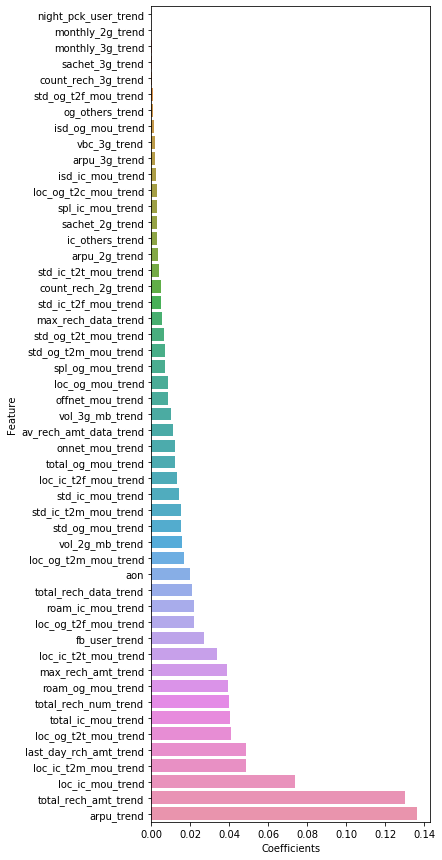

In [110]:
# Identifying the features that have most impact
outcome=pd.DataFrame({"Feature":list(X_test.columns),"Coefficients":rfc.feature_importances_.reshape(-1)})
outcome

# Plotting the same
plt.figure(figsize = (5,15))
outcome = outcome.sort_values('Coefficients')
sns.barplot(outcome['Coefficients'],outcome['Feature'],orient = 'h')
plt.show()

## Step 6.2: Building Non-interpretable models

### Finding the Principal Component Vectors

In [111]:
from sklearn.decomposition import PCA

In [112]:
pca = PCA(random_state = 50)
pca.fit_transform(X_train)

array([[ 1.59376126e+00,  5.02934959e-01,  5.33704359e-03, ...,
         1.39684276e-15,  1.91106940e-15,  7.70130738e-15],
       [ 1.78528337e+00,  8.15924395e-01,  7.23735328e-02, ...,
        -2.48386848e-15,  3.64998930e-15, -5.54831031e-15],
       [ 6.26868392e-01,  3.03449810e+00,  1.89892139e+00, ...,
         4.53598709e-15, -4.83832494e-15,  9.35184164e-16],
       ...,
       [ 6.53742969e-04, -4.44044260e+00, -1.02689197e+00, ...,
         5.76964646e-17, -4.68237922e-17, -9.90218566e-18],
       [ 9.22340690e-01,  1.21714774e-01,  1.24716426e-02, ...,
         1.04160875e-16, -9.19518777e-17,  1.30602041e-17],
       [-2.67470328e+00, -2.34520980e+00,  1.71457230e-02, ...,
         8.50903998e-17, -9.70206029e-17, -3.86439867e-17]])

In [113]:
# Calculating the Cumulative Variance for plotting the Spree plot
var_cum = np.cumsum(pca.explained_variance_ratio_)

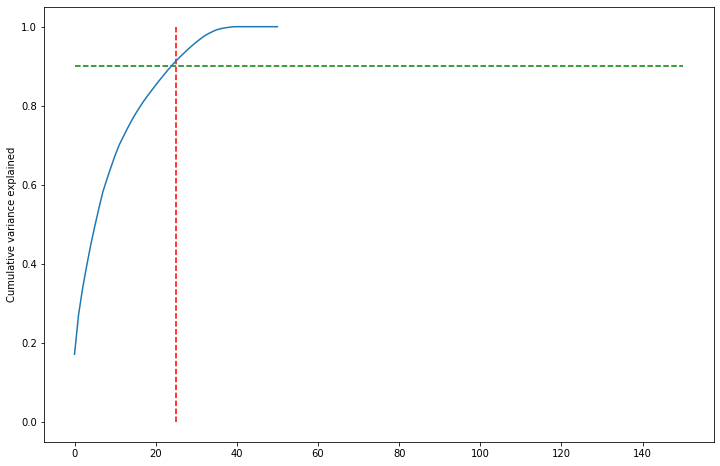

In [114]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=25, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.9, xmax=150, xmin=0, colors="g", linestyles="--")
plt.plot(var_cum)
plt.ylabel("Cumulative variance explained")
plt.show()

In [115]:
pca_new = PCA(0.9,random_state = 50)
X_train_pca = pca_new.fit_transform(X_train)

In [116]:
len(pca_new.components_)

25

In [117]:
from sklearn.decomposition import IncrementalPCA
pca = IncrementalPCA(n_components= 25)
X_train_pca = pca.fit_transform(X_train)
X_train_pca.shape

(38050, 25)

In [118]:
X_test_pca = pca.transform(X_test)
X_test_pca.shape

(9001, 25)

In [119]:
X_train_pca= pd.DataFrame(X_train_pca)
X_train_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,1.594134,0.503402,-0.019743,0.280016,0.322852,-0.203552,-0.506482,0.002596,0.209548,-0.090430,0.191005,-0.074974,0.220965,0.133628,0.008128,-0.351289,0.110112,0.022447,-0.008267,-0.110732,-0.417794,0.048804,-0.043713,-0.285437,-0.034047
1,1.785575,0.817433,-0.064651,-0.781981,0.713218,-0.080474,-0.317513,0.219780,0.296397,-0.389680,0.180877,-0.002869,-0.074938,-0.006877,0.083820,0.026558,-0.163515,-0.000410,-0.072997,0.004870,-0.130653,0.155063,-0.132975,0.586485,-0.105803
2,0.627511,3.044669,-1.939925,0.507291,-0.114015,1.167675,-0.108790,-0.911673,-1.543217,1.226157,-1.802196,0.349864,-0.936304,0.216790,-1.024712,1.061287,-1.690438,-1.119808,1.597445,-0.762244,-1.577736,-0.233590,-0.900456,0.805167,0.718963
3,2.047107,-2.349413,1.579618,0.795467,0.626848,-0.984401,0.074537,0.443939,0.040425,0.852907,-0.801029,-0.168365,2.554587,-0.519116,-1.023225,0.575062,0.313557,0.401993,0.870907,-0.050039,0.331411,0.335678,-0.319209,1.365871,-0.222823
4,1.469286,0.154317,0.115971,-0.383584,0.237761,0.053021,-0.040877,-0.020973,-0.208348,-0.003609,-0.113652,0.121592,-0.901126,0.154398,0.226055,-0.093889,-0.174433,-0.029521,-0.476713,-0.005336,-0.443578,0.112266,0.038157,-0.095582,0.092956


### Step 6.2.1: Logistic Regression using PCA

In [170]:
# Doing a logistic regression on the training dataset
import statsmodels.api as sm
from sklearn import metrics

logreg = LogisticRegression()
logm1 = logreg.fit(X_train_pca, y_train)

y_train_pred = logm1.predict(X_train_pca)

#Creating a dataframe with the actual churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustIndex'] = y_train.index

# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

print("Train Precision : {}".format(round(metrics.precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted),2)))
print("Train Recall : {}".format(round(metrics.recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted),2)))
print("Train Accuracy : {}".format(round(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted),2)))

# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print("Train Confusion Matrix \n", confusion)

Train Precision : 0.79
Train Recall : 0.76
Train Accuracy : 0.78
Train Confusion Matrix 
 [[15123  3902]
 [ 4528 14497]]


We are focused on the Recall in this exercise since the emphasis is to capture all churn customers. So maximize True Positive and minimize False Negatives. The higher the recall ratio the better would be our ability to idenitfy churn customers and reduce possibility of missing out on identifying any churn customer

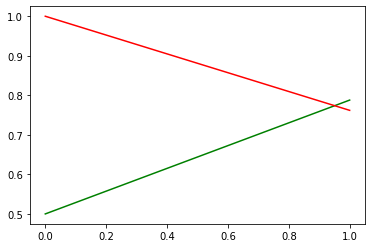

In [171]:
# Plotting a precision-Recall curve to find the optimal cutoff point
from sklearn.metrics import precision_recall_curve
#y_train_pred_final.Churn, y_train_pred_final.predicted
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

From the curve above, the two lines intersect at 0.9. So we can say that 0.9 seems to be a optimal cutoff point

   Churn  Churn_Prob  CustIndex  predicted  0.0  0.1  0.2  0.3  0.4  0.5  0.6  \
0    0.0         0.0       4773          0    0    0    0    0    0    0    0   
1    0.0         0.0      24832          0    0    0    0    0    0    0    0   
2    0.0         1.0      68515          1    1    1    1    1    1    1    1   
3    0.0         0.0      64943          0    0    0    0    0    0    0    0   
4    0.0         0.0      94418          0    0    0    0    0    0    0    0   

   0.7  0.8  0.9  1.0  
0    0    0    0    0  
1    0    0    0    0  
2    1    1    1    0  
3    0    0    0    0  
4    0    0    0    0  
     prob  accuracy     sensi     speci
0.0   0.0  0.778449  0.761997  0.794901
0.1   0.1  0.778449  0.761997  0.794901
0.2   0.2  0.778449  0.761997  0.794901
0.3   0.3  0.778449  0.761997  0.794901
0.4   0.4  0.778449  0.761997  0.794901
0.5   0.5  0.778449  0.761997  0.794901
0.6   0.6  0.778449  0.761997  0.794901
0.7   0.7  0.778449  0.761997  0.794901
0.8   0.8

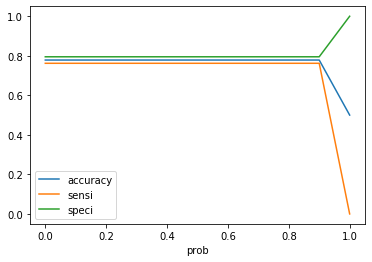

In [172]:
# We can also plot the specificity, sensitivity and accuracy graphs to revalidate the cutoff point
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(11)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
print(y_train_pred_final.head())

# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9, 1]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

We get the same result of 0.9 as the cutoff point. So we will make predictions on the test dataset using this cutoff value

In [173]:
#Working on the test dataset with the optimal cutoff (0.9)
#----------------------------------------------------
y_test_pred = logm1.predict(X_test_pca)

#Creating a dataframe with the actual churn flag and the predicted probabilities
y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['CustIndex'] = y_test.index

# Creating new column 'predicted' with 1 if Churn_Prob > 0.9 else 0
y_test_pred_final['predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.9 else 0)

#print(precision_score(y_test_pred_final.Churn, y_test_pred_final.predicted))
#print(recall_score(y_test_pred_final.Churn, y_test_pred_final.predicted))
#print(metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.predicted))

print("Test Precision : {}".format(round(metrics.precision_score(y_test_pred_final.Churn, y_test_pred_final.predicted),2)))
print("Test Recall : {}".format(round(metrics.recall_score(y_test_pred_final.Churn, y_test_pred_final.predicted),2)))
print("Test Accuracy : {}".format(round(metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.predicted),2)))

# Confusion matrix 
confusion = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.predicted )
print("Test Confusion Matrix \n", confusion)

Test Precision : 0.27
Test Recall : 0.78
Test Accuracy : 0.8
Test Confusion Matrix 
 [[6530 1672]
 [ 173  626]]


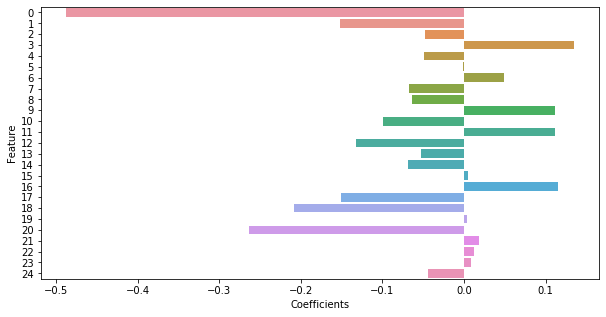

In [174]:
# Identifying the features that have most impact
Logist_model_outcome_pca=pd.DataFrame({"Feature":list(pd.DataFrame(X_test_pca).columns),"Coefficients":logm1.coef_.reshape(-1)})
Logist_model_outcome_pca

# Plotting the same
plt.figure(figsize = (10,5))
Logist_model_outcome_pca = Logist_model_outcome_pca.sort_values('Coefficients')
sns.barplot(Logist_model_outcome_pca['Coefficients'],Logist_model_outcome_pca['Feature'],orient = 'h')
plt.show()

In [125]:
# Plotting the ROC curve to determine the Area Under Curve (AUC)
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

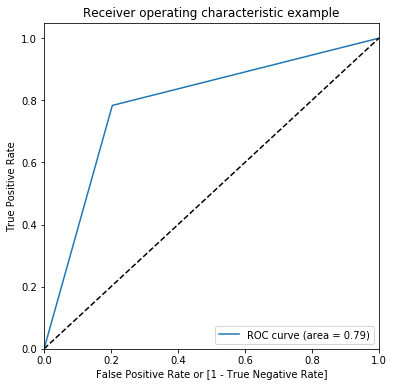

(array([0.        , 0.20385272, 1.        ]),
 array([0.        , 0.78347935, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [126]:
draw_roc(y_test_pred_final.Churn, y_test_pred_final.predicted)

In [127]:
#draw_roc(y_pred_final.Churn, y_pred_final.predicted)
"{:2.2f}".format(metrics.roc_auc_score(y_test_pred_final.Churn, y_test_pred_final.Churn_Prob))

'0.79'

### Step 6.2.2: Decision Tree

In [128]:
from sklearn.tree import DecisionTreeClassifier
model1 = DecisionTreeClassifier(max_depth=5)
model1.fit(X_train_pca, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [129]:
# Making predictions
y_pred_test = model1.predict(X_test_pca)

In [130]:
# Printing out all accuracies
print("Precision : {}".format(round(metrics.precision_score(y_test, y_pred_test),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test, y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))

Precision : 0.28
Recall : 0.77
Accuracy : 0.8
ROC-AUC Score : 0.79


In [131]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.97      0.80      0.88      8202
         1.0       0.28      0.77      0.41       799

    accuracy                           0.80      9001
   macro avg       0.63      0.79      0.64      9001
weighted avg       0.91      0.80      0.84      9001



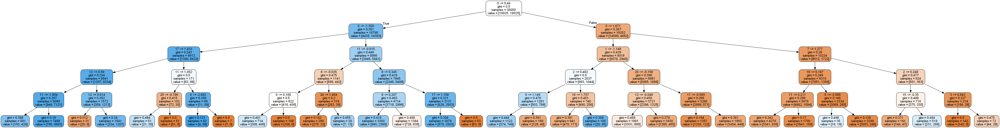

In [132]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
#features = list(model1[1:])
features=pd.DataFrame(X_train_pca).columns
features

# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(model1, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Step 6.2.3: Decision Tree with Hyperparameter Tuning

#### Tuning max_depth

In [133]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 40, 5)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring='recall', 
                   return_train_score=True)
tree.fit(X_train_pca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(1, 40, 5)}, pre_dispatch='2*n_jobs'

In [134]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.256215,0.111594,0.015801,0.008353,1,{'max_depth': 1},0.754271,0.761104,0.759264,0.749277,0.750854,0.754954,0.004602,8,0.755125,0.753417,0.753876,0.756373,0.755979,0.754954,0.001151
1,0.982656,0.284086,0.010401,0.002577,6,{'max_depth': 6},0.795269,0.802365,0.820762,0.780026,0.757950,0.791275,0.021192,7,0.796781,0.807622,0.825624,0.793890,0.770894,0.798962,0.017912
2,2.016715,0.241334,0.017201,0.003868,11,{'max_depth': 11},0.960578,0.965046,0.951380,0.925624,0.917214,0.943968,0.019117,6,0.964915,0.969514,0.956570,0.939750,0.926675,0.951485,0.016028
3,1.723099,0.330028,0.011401,0.003262,16,{'max_depth': 16},0.996058,0.995269,0.992116,0.979763,0.993430,0.991327,0.005944,5,0.997043,0.996715,0.994481,0.982129,0.996715,0.993417,0.005718
4,0.979056,0.095059,0.006200,0.000400,21,{'max_depth': 21},0.998423,0.999212,1.000000,0.986334,0.998160,0.996426,0.005087,4,0.999671,0.999737,1.000000,0.989225,0.999080,0.997543,0.004170


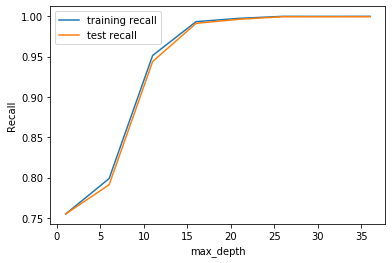

In [135]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()


#### Tuning min_samples_leaf

In [136]:
# GridSearchCV to find optimal min_sample_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall", 
                   return_train_score=True)
tree.fit(X_train_pca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             p

In [137]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.962055,0.079644,0.007000,1.095627e-03,5,{'min_samples_leaf': 5},0.984757,0.981078,0.979501,0.982917,0.981603,0.981971,0.001772,1,0.994809,0.992247,0.993233,0.994284,0.994021,0.993719,0.000895
1,0.814247,0.022294,0.011401,1.080053e-02,25,{'min_samples_leaf': 25},0.896978,0.903548,0.898555,0.888568,0.876741,0.892878,0.009401,2,0.921945,0.928778,0.917280,0.912286,0.904862,0.917030,0.008158
2,0.756043,0.031776,0.006200,4.000426e-04,45,{'min_samples_leaf': 45},0.869645,0.862812,0.879632,0.866754,0.873325,0.870434,0.005748,3,0.894152,0.885874,0.886005,0.888830,0.891459,0.889264,0.003194
3,0.702040,0.016912,0.006000,1.168008e-07,65,{'min_samples_leaf': 65},0.856505,0.844941,0.858870,0.843101,0.858607,0.852405,0.006919,4,0.867411,0.864258,0.870762,0.857556,0.874704,0.866938,0.005837
4,1.228270,0.453752,0.010801,3.249820e-03,85,{'min_samples_leaf': 85},0.858344,0.839685,0.838633,0.811564,0.827332,0.835112,0.015415,6,0.864455,0.851380,0.855322,0.827267,0.840342,0.847753,0.012837


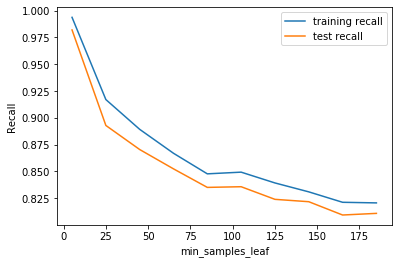

In [138]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()


#### Tuning min_samples_split

In [139]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                   return_train_score=True)
tree.fit(X_train_pca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'min_samples_split': range(5, 200, 20)},
             

In [140]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.035459,0.063699,0.0070,0.000632,5,{'min_samples_split': 5},0.998160,0.998686,0.998949,0.999737,0.998423,0.998791,0.000541,1,0.999737,0.999737,0.999869,0.999934,1.000000,0.999855,0.000105
1,1.021658,0.039880,0.0064,0.000490,25,{'min_samples_split': 25},0.973456,0.967674,0.976347,0.977924,0.972405,0.973561,0.003544,2,0.988042,0.980683,0.985808,0.986268,0.983837,0.984928,0.002509
2,1.016858,0.035099,0.0070,0.001095,45,{'min_samples_split': 45},0.953219,0.948489,0.956373,0.958213,0.947700,0.952799,0.004167,3,0.972339,0.965177,0.965900,0.968857,0.965309,0.967516,0.002757
3,1.004457,0.023713,0.0064,0.000800,65,{'min_samples_split': 65},0.938239,0.937451,0.940604,0.935874,0.931669,0.936767,0.002972,4,0.956702,0.957884,0.951971,0.947109,0.948555,0.952444,0.004279
4,0.999257,0.020352,0.0070,0.000632,85,{'min_samples_split': 85},0.922996,0.919054,0.925624,0.920631,0.927727,0.923206,0.003169,5,0.944350,0.938436,0.939422,0.935874,0.940670,0.939750,0.002788


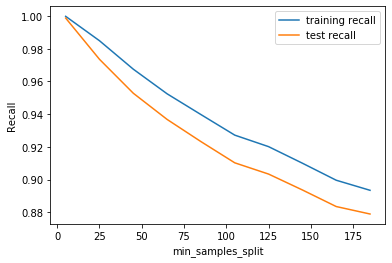

In [141]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid search to find optimal hyperparameters

In [142]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(10, 25, 5),
    'min_samples_leaf': range(5, 25, 5),
    'min_samples_split': range(5, 50, 5),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, scoring='recall', 
                   return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train_pca,y_train)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1080 out of 1080 | elapsed: 24.6min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                   

In [143]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.001457,0.028822,0.007000,2.530035e-03,entropy,10,5,5,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.941130,0.907753,0.912746,0.904336,0.889093,0.911012,0.017004,119,0.945532,0.909790,0.918857,0.922273,0.894218,0.918134,0.016792
1,1.054260,0.103670,0.007000,2.000141e-03,entropy,10,5,10,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.939553,0.906965,0.911958,0.904862,0.888830,0.910434,0.016493,120,0.943101,0.909658,0.918791,0.922668,0.893955,0.917635,0.016122
2,0.977856,0.007111,0.006200,4.000425e-04,entropy,10,5,15,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.938502,0.905650,0.910907,0.904336,0.887779,0.909435,0.016470,121,0.942576,0.908870,0.917740,0.922076,0.893824,0.917017,0.016023
3,0.988857,0.033381,0.006000,1.168008e-07,entropy,10,5,20,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.940079,0.904074,0.910381,0.902234,0.886991,0.908752,0.017447,123,0.945007,0.908213,0.917740,0.920828,0.893430,0.917043,0.016925
4,0.992657,0.033692,0.006200,3.999949e-04,entropy,10,5,25,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.938239,0.903285,0.908804,0.899869,0.885151,0.907070,0.017442,132,0.944152,0.908081,0.916623,0.919645,0.892444,0.916189,0.016874
5,1.245671,0.545812,0.007800,2.135565e-03,entropy,10,5,30,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.937451,0.901708,0.906439,0.900394,0.885414,0.906281,0.017103,135,0.943298,0.906965,0.915177,0.919777,0.892641,0.915572,0.016652
6,1.347077,0.396667,0.008001,2.607785e-03,entropy,10,5,35,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.935611,0.901708,0.903811,0.900920,0.882523,0.904915,0.017153,137,0.940342,0.906965,0.912024,0.920171,0.890736,0.914047,0.016288
7,0.978256,0.022141,0.005800,4.000664e-04,entropy,10,5,40,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.935611,0.899606,0.904074,0.899606,0.882260,0.904231,0.017379,138,0.940933,0.905322,0.911761,0.918331,0.890145,0.913298,0.016680
8,1.559689,0.541446,0.008400,2.576944e-03,entropy,10,5,45,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.932194,0.896452,0.899869,0.896715,0.880420,0.901130,0.016952,148,0.939816,0.903351,0.909330,0.916754,0.887976,0.911445,0.017052
9,1.367478,0.480157,0.009000,3.795024e-03,entropy,10,10,5,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.927989,0.898029,0.898029,0.896189,0.877004,0.899448,0.016328,159,0.937319,0.903482,0.909264,0.917937,0.887714,0.911143,0.016386


In [144]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.988173455978975
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [145]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=20, 
                                  min_samples_leaf=5,
                                  min_samples_split=10)
clf_entropy.fit(X_train_pca, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [146]:
# accuracy score
clf_entropy.score(X_test_pca,y_test)

0.857015887123653

In [147]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.754513 to fit



In [148]:
# classification metrics
from sklearn.metrics import classification_report,confusion_matrix
y_pred_pca = clf_entropy.predict(X_test_pca)
print(classification_report(y_test, y_pred_pca))

              precision    recall  f1-score   support

         0.0       0.95      0.89      0.92      8202
         1.0       0.30      0.47      0.37       799

    accuracy                           0.86      9001
   macro avg       0.62      0.68      0.64      9001
weighted avg       0.89      0.86      0.87      9001



In [149]:
# confusion matrix
print(confusion_matrix(y_test,y_pred_pca))

[[7337  865]
 [ 422  377]]


In [150]:
# Printing out all accuracies
print("Precision : {}".format(round(metrics.precision_score(y_test, y_pred_pca),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_pca),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test, y_pred_pca),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_pca),2)))

Precision : 0.3
Recall : 0.47
Accuracy : 0.86
ROC-AUC Score : 0.68


### Step 6.2.4: Let's try XGBoost on the dataset

In [151]:
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
import gc # for deleting unused variables

In [152]:
# Fitting the model with default parameters
model1 = XGBClassifier()
model1.fit(X_train_pca,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [153]:
y_pred_test = model1.predict_proba(X_test_pca)

In [154]:
# evaluate predictions
from sklearn import metrics
roc = metrics.roc_auc_score(y_test, y_pred_test[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 84.11%


In [155]:
y_pred_test = pd.DataFrame(y_pred_test)
y_pred_test=y_pred_test.iloc[:,1]
y_pred_test.head()

0    0.004003
1    0.026808
2    0.391031
3    0.045192
4    0.214691
Name: 1, dtype: float32

In [156]:
y_pred_test = y_pred_test.apply(lambda x: 1 if x > 0.5 else 0)
y_pred_test.head()

0    0
1    0
2    0
3    0
4    0
Name: 1, dtype: int64

In [157]:
print("Precision : {}".format(round(metrics.precision_score(y_test,y_pred_test ),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test,y_pred_test),2)))
print(confusion_matrix(y_test,y_pred_test))

Precision : 0.43
Recall : 0.53
Accuracy : 0.9
[[7643  559]
 [ 373  426]]


Let's find the optimal parameters

In [158]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(10, 25, 5),
    'n_estimators ': range(5, 25, 5),
}

n_folds = 5

# Instantiate the grid search model
dtree = XGBClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, scoring='recall', 
                   return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train_pca,y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[21:54:27] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[21:54:38] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:54:48] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:54:58] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in

[21:58:36] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:58:49] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:59:02] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in

[22:03:18] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:03:32] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:03:47] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in

[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 13.3min finished


[22:07:45] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { n_estimators  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estim...
                                     objective='binary:logistic',
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
                                     subsample=None, tree_method=Non

In [159]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9995269382391591 using {'max_depth': 10, 'n_estimators ': 5}


In [160]:
# Fitting the model with optimal parameters
xgb = XGBClassifier(max_depth = 10, n_estimators = 5, random_state=100)
xgb.fit(X_train_pca,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=5, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=100, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [161]:
# Making predictions
y_pred_test = model1.predict_proba(X_test_pca)

y_pred_test = pd.DataFrame(y_pred_test)
y_pred_test=y_pred_test.iloc[:,1]

y_pred_test = y_pred_test.apply(lambda x: 1 if x > 0.5 else 0)
y_pred_test.head()

print("Precision : {}".format(round(metrics.precision_score(y_test,y_pred_test ),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test,y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test, y_pred_test),2)))
print(confusion_matrix(y_test,y_pred_test))

Precision : 0.43
Recall : 0.53
Accuracy : 0.9
ROC-AUC Score : 0.73
[[7643  559]
 [ 373  426]]


### Step 6.2.6: Adaboost Algorithm

In [162]:
from sklearn.tree import DecisionTreeClassifier
model1 = DecisionTreeClassifier(max_depth=5)
model1.fit(X_train_pca, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [163]:
# adaboost with the tree as base estimator
from sklearn.ensemble import AdaBoostClassifier

estimators = list(range(1, 50, 5))

abc_scores = []
for n_est in estimators:
    ABC = AdaBoostClassifier(
    base_estimator=model1, 
    n_estimators = n_est)
    
    ABC.fit(X_train_pca, y_train)
    y_pred = ABC.predict(X_test_pca)
    score = metrics.recall_score(y_test, y_pred)
    abc_scores.append(score)
    

In [164]:
# Let's check the scores
abc_scores

[0.7709637046307884,
 0.7296620775969962,
 0.672090112640801,
 0.6270337922403004,
 0.590738423028786,
 0.5632040050062578,
 0.5244055068836045,
 0.5068836045056321,
 0.4655819774718398,
 0.4493116395494368]

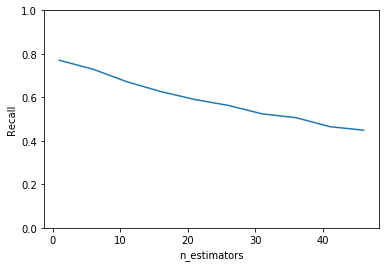

In [165]:
# plot test scores and n_estimators
# plot
plt.plot(estimators, abc_scores)
plt.xlabel('n_estimators')
plt.ylabel('Recall')
plt.ylim([0, 1])
plt.show()

In [166]:
# Running with optimal parameters
ABC = AdaBoostClassifier(
    base_estimator=model1, 
    n_estimators = 1)
ABC.fit(X_train_pca, y_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=5,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                          

In [167]:
# Prediction
y_pred_test = ABC.predict(X_test_pca)

In [168]:
# Accuracy
print("Precision : {}".format(round(metrics.precision_score(y_test,y_pred_test ),2)))
print("Recall : {}".format(round(metrics.recall_score(y_test, y_pred_test),2)))
print("Accuracy : {}".format(round(metrics.accuracy_score(y_test,y_pred_test),2)))
print("ROC-AUC Score : {}".format(round(metrics.roc_auc_score(y_test,y_pred_test),2)))
print(confusion_matrix(y_test,y_pred_test))

Precision : 0.28
Recall : 0.77
Accuracy : 0.8
ROC-AUC Score : 0.79
[[6598 1604]
 [ 183  616]]


## Step 7: Summary of Outcomes from all Models

|Model Type |Test Precision |Test Recall |Test Accuracy |ROC-AUC Score|
|:-:|:-:|:-:|:-:|:-:|
|<b>Interpretable Models</b>||||
|Logistic Regression with RFE|0.28|0.78|0.8|0.79|
|Decision Tree with RFE|0.27|0.79|0.79|0.79|
|Decision Tree with RFE with Hyperparameter Tuning|0.34|0.59|0.86|0.74|
|Random Forest |0.63|0.49|0.93|0.73|
|Random Forest with Hyperparameter Tuning|0.43|0.75|0.89|0.83|
|<b>Non Interpretable Models</b>||||
|Logistic Regression after PCA|0.27|0.78|0.8|0.79|
|Decision Tree after PCA without Hyperparameter Tuning|0.28|0.77|0.8|0.79|
|Decision Tree after PCA with Hyperparameter Tuning|0.25|0.79|0.77|0.78|
|XGBoost after PCA|0.43|0.53|0.9|0.73|
|Adaboost after PCA|0.28|0.77|0.8|0.79|

## Conclusions

1. Among all the models, Random Forest provides the best recall rates (0.79). Since we are interested in increasing the True Positives and reducing the False Negatives, Recall is the metric we are focused on
2. The accuracy and the AUC scores of all models are very close to each other in the range of 0.83-0.91 so one model doesn't standout compared to others
3. The ROC-AUC score of all models are also very close to each other in the range of (0.56-0.64) so one model doesn't standout compared to others
4. We dont see a big difference in the final outcomes of the models where RFE was used for parameter reduction vs. PCA being used to reduce the dimensions/variables.
5. Hyperparameter tuning on the non-interpretable models did not yield a significant jump in the recall scores

## Recommendations

The Logistic Regrssion model with RFE had the highest recall rate so we will use the final output of that model to make our recommendations

<b>I. Identify ways to detect a probable customer is going to churn during the action phase</b>
>1. Any decline (measured by usage in current month minus average usage in prior 2 months) in the total outgoing minutes of a customer (total_og_mou) has a large contribution towards the odds of the custmer churning next month 
>2. Age on network (aon) is the second biggest contributer to the odds of the customer churning. This means that newer customers have a higher propensity to churn than the old customers
>3. A sharp decline (measured by current month incoming call usage minus average of prior 2 months) in the local incoming call usage (loc_ic_mou) is the third biggest contributor to the odds of the customer churning. <br>

<b>II. Incentivise the identified probable churn customers in the action month so that they dont churn</b>
>1. Offer targeted incentives to these customers to continue with the operator. Since the outgoing and incoming call usage decline is one of the indicators of churn, these customers could be offered call related incentives than data related incentives
>2. Since the newer customers have a higer propensity to churn, target them with monthly recharges or postpaid deals so that they stick for a longer period
>3. The timing of the offer could be towards the later part of the action month which will ensure they will not get into churn phase <br>

<b>III. Continuous monitoring and model updates</b>
>1. Continuously monitor the outcome of the incentives on the churn behaviour and input the same into the model. If needed retune the hyperparameters to make better predictions
>2. In case of any significant event impacting churn, redevelop the model factoring the parameters describing the significant event.

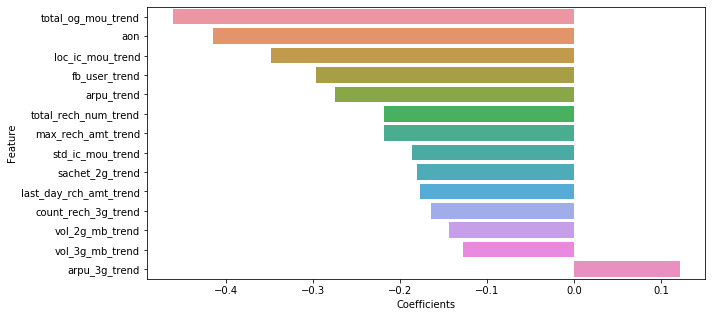

In [182]:
# Outcome from the Logistic Regression model with RFE for reference
# Plotting the same
plt.figure(figsize = (10,5))
Logist_model_outcome = Logist_model_outcome.sort_values('Coefficients')
sns.barplot(Logist_model_outcome['Coefficients'],Logist_model_outcome['Feature'],orient = 'h')
plt.show()